<a href="https://colab.research.google.com/github/dkraynev/projects/blob/main/Multi_Algorithm_Approach_to_Fraud_Detection_From_Auto_Encoders_to_Ensemble_Methods.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://github.com/dkraynev/projects/blob/7f935c620fa734cda746848e8e896f4bbb2a5178/Multi_Algorithm_Approach_to_Fraud_Detection_From_Auto_Encoders_to_Ensemble_Methods.ipynb

## Peer-graded Assignment: DTSA 5511 Introduction to Deep Learning Final Project
---
# Multi-Algorithm Approach to Fraud Detection: From Auto-Encoders to Ensemble Methods

## 1. Introduction

The realm of unsupervised learning plays a vital role in various domains, particularly in anomaly detection, clustering, and dimensionality reduction. For this final project, under the DTSA 5511 Introduction to Deep Learning course, we embarked on a comprehensive exploration of different unsupervised learning algorithms to identify anomalies within a dataset of credit card transactions. Our investigation initially focused on leveraging autoencoders, but we expanded our approach to include additional machine learning models, aiming to enhance our understanding and improve detection accuracy.

This project aims to identify fraudulent transactions within the highly imbalanced Credit Card Fraud Detection dataset from Kaggle. By combining the strengths of autoencoders with other machine learning models, we demonstrate a multi-algorithm approach that not only uncovers the nuances of unsupervised learning but also showcases the effectiveness of these models in real-world fraud detection scenarios.

---

## 2. Problem Identification

In the context of this project, the primary problem we seek to address is detecting fraudulent transactions within a dataset containing millions of credit card transactions. Fraud detection is crucial in the finance industry, where vast volumes of transactions need to be scrutinized in real-time to prevent financial losses.

The dataset, sourced from Kaggle (https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud/data), comprises 284,807 transactions made by European cardholders over two days in September 2013. Among these transactions, only 492 are labeled as fraudulent, representing a mere 0.172% of the total. The dataset's highly imbalanced nature poses a significant challenge for machine learning models, as they need to accurately identify rare fraudulent transactions without being overwhelmed by the vast majority of legitimate transactions.

---

## 3. Exploratory Data Analysis (EDA)

### 3.1 Data Overview and Cleaning

Our exploratory data analysis began with loading the dataset and conducting basic data cleaning. We decided to remove the 'Time' and 'Amount' columns, as these were not directly relevant to our anomaly detection task. To avoid any potential syntax issues during analysis, we renamed the 'Class' column, which indicates whether a transaction is fraudulent (1) or not (0), to 'label.'

After loading the data, we examined the distribution of the features. Since the dataset had been pre-processed using PCA, most features were already centered around zero but exhibited varying ranges. To ensure all features contributed equally to the model, we applied a log transformation to the 'Amount' feature and normalized all features, scaling them between 0 and 1.

### 3.2 Visualizing Data Distributions

Visualization plays a critical role in understanding the data. We utilized histograms and density plots to observe the distribution of features before and after normalization. This visual assessment confirmed that the data became more uniformly distributed post-normalization, with feature ranges compressed between 0 and 1, making the dataset more suitable for machine learning model training.

In addition, we employed t-SNE for dimensionality reduction and visualized potential clusters within the data. While the fraudulent transactions did not form a distinct cluster, they generally grouped together, indicating that the autoencoder could effectively compress and separate the data based on inherent characteristics.

### 3.3 Identifying Outliers and Anomalies

Identifying outliers is crucial in fraud detection, as fraudulent transactions often manifest as outliers within the dataset. We applied two methods to identify these outliers:

- **Percentiles:** We set a threshold at the top x% of the dataset, labeling these transactions as potential outliers.
- **Median Absolute Deviation (MAD):** A more robust approach that uses the median and median absolute deviation to identify outliers. This method is less sensitive to extreme values and is well-suited for datasets like ours, where the majority of transactions are non-fraudulent.

---

## 4. Model Building and Training

### 4.1 Model Selection: Autoencoder and Other Algorithms

Given the unsupervised nature of the problem, we initially selected an autoencoder as our primary model. Autoencoders are neural networks designed to learn a compressed representation of the input data and then reconstruct it. They are particularly effective for anomaly detection, as they are trained exclusively on normal data. Consequently, the model struggles to accurately reconstruct anomalous data, leading to higher reconstruction errors for fraudulent transactions.

To enhance our analysis, we incorporated five additional machine learning algorithms: Logistic Regression, Support Vector Classifier, Decision Tree Classifier, Random Forest Classifier, and K-Nearest Neighbors. These models were evaluated based on their performance using different feature selection methods, allowing us to compare their efficacy alongside the autoencoder.

### 4.2 Model Architecture and Feature Selection

The autoencoder model architecture was constructed using Keras, a high-level API within TensorFlow, featuring an encoder and a decoder:

- **Encoder:** Compresses the input data into a latent space representation, reducing its dimensionality while retaining its most important features.
- **Decoder:** Attempts to reconstruct the original input from the latent space representation. The difference between the input and the reconstructed output, known as reconstruction loss, is used to identify anomalies.

For the other machine learning models, feature selection was performed based on correlation plots and ANOVA scores. This selection process helped identify the most relevant features, ensuring that the models focused on the factors most likely to distinguish between fraudulent and non-fraudulent transactions.

### 4.3 Training the Models

The autoencoder was trained on clean transactions (non-fraudulent), with the goal of minimizing reconstruction loss. Various callbacks were implemented to monitor the training process, including Early Stopping, Model Checkpoint, and TensorBoard, ensuring the model did not overfit to the training data.

For the other algorithms, we applied cross-validation and hyperparameter tuning to optimize their performance. The models were trained on the selected features, and their performance was evaluated using metrics such as ROC AUC Score and F1 Score.

---

## 5. Evaluating and Visualizing Results

### 5.1 Reconstruction Loss and Model Comparisons

After training, the autoencoder was applied to the test set, which included both clean and fraudulent transactions. As anticipated, fraudulent transactions exhibited higher reconstruction losses, indicating that the autoencoder successfully identified anomalies within the data.

We also compared the performance of all six models, ranked from best to worst, based on their F1 Score for fraudulent transactions. The comparison provided valuable insights into the strengths and weaknesses of each approach, helping us identify the most effective model for fraud detection.

| Rank | ML Algorithm | Cross Validation Score | ROC AUC Score | F1 Score (Fraud) |
|------|--------------|------------------------|---------------|------------------|
| 1    | K-Nearest Neighbors | 99.54% | 98.47% | 97% |
| 2    | Logistic Regression | 98.45% | 94.69% | 94% |
| 3    | Support Vector Classifier | 98.32% | 94.40% | 94% |
| 4    | Random Forest Classifier | 97.84% | 91.71% | 91% |
| 5    | Decision Tree Classifier | 96.67% | 91.36% | 90% |
| **6**    | **Autoencoder** | **N/A** | **85.00%** | **30%** |


### 5.2 Setting a Threshold and Balancing Data

To classify transactions as fraudulent or non-fraudulent, we established a threshold for reconstruction loss using the MAD method. By adjusting this threshold, we were able to control the balance between recall and precision, ensuring the model's output aligned with the desired accuracy level.

We also utilized SMOTE (Synthetic Minority Over-sampling Technique) to address the imbalance in the dataset. This technique helped in creating a balanced dataset, making the models more robust and capable of detecting fraudulent transactions with higher accuracy.

### 5.3 Performance Metrics and Cost Analysis

Given access to the true labels, we evaluated the model's performance using a confusion matrix, precision, and recall metrics. The results indicated that while the model could not perfectly classify all fraudulent transactions, it achieved a commendable balance between recall and precision.

Considering the real-world implications, we also factored in the asymmetric error cost, where missing a fraudulent transaction incurs a higher cost than falsely flagging a legitimate one. This analysis helped fine-tune the model's final threshold, optimizing its performance for practical application.

---

## 6. Conclusion

The results of this project underscore the potential of a multi-algorithm approach to fraud detection, combining the strengths of unsupervised and supervised learning models. The autoencoder, in particular, demonstrated its effectiveness in identifying anomalies within a dataset, even without prior exposure to fraudulent cases during training.

Moving forward, further refinement of the model architecture, diversification of the training data, and augmentation of the dataset with additional features could enhance the model's accuracy and robustness. Additionally, exploring ensemble methods that combine the strengths of multiple algorithms could yield even better results in detecting fraud.

This project highlights the importance of adopting a multi-faceted approach to anomaly detection, leveraging different algorithms to address the unique challenges posed by imbalanced datasets and complex data structures.

---

## 7. References

- [Chargeback Gurus - Credit Card Fraud Detection](https://www.chargebackgurus.com/blog/credit-card-fraud-detection)
- [CNBC - What is a Credit Card?](https://www.cnbc.com/select/what-is-a-credit-card/)
- [Fortune Business Insights - Fraud Detection and Prevention Market](https://www.fortunebusinessinsights.com/industry-reports/fraud-detection-and-prevention-market-100231)
- [Kaggle - Credit Card Fraud Detection Dataset](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud/data)

# Problem Statement

Credit card fraud involves the unauthorized use of someone else's credit card information to conduct financial transactions, often resulting in significant financial losses for both individuals and financial institutions. Credit cards, initially designed to enhance purchasing power by allowing users to borrow funds from a bank with the promise of repayment, have become increasingly prevalent with the rise of e-commerce and digital platforms, especially during the COVID-19 pandemic. This surge in usage has been paralleled by a troubling increase in credit card fraud, contributing to global economic losses exceeding $24 billion annually.

As the frequency of these fraudulent activities continues to climb, the importance of developing robust and automated detection systems becomes increasingly apparent. The financial sector, now a multi-billion dollar industry, is heavily invested in AI and machine learning to tackle this growing threat. The goal of this project is to contribute to these efforts by exploring various machine learning models, including autoencoders and other algorithms, to effectively identify and prevent credit card fraud in real-time. The urgency of addressing this issue cannot be overstated, as the global economy and the trust in digital financial systems depend on our ability to mitigate these risks efficiently.

In sections 1-9, we will explore the autoencoder model, followed by an examination of five additional models to evaluate their effectiveness in detecting credit card fraud.

# 1. Exploring Auto-Encoders

Auto-encoders are a crucial component in unsupervised learning, widely applied in tasks such as dimensionality reduction and anomaly detection. These specialized neural networks are designed to learn efficient representations of input data by compressing it into a latent space and then reconstructing the original data from this compressed form.

The diagram below showcases the fundamental structure of an auto-encoder:

![Autoencoder Basic Architecture](https://images.squarespace-cdn.com/content/v1/62f1caa0a2cb083186ccce31/c3350b48-ff66-4e04-aa79-56cec8350ca2/autoencoder_architecture.png)

Auto-encoders function by processing the input through an encoder, which reduces the data to a lower-dimensional latent space. This is followed by a decoder that reconstructs the original input from this compact representation. The bottleneck, or the compressed layer, forces the network to learn the most efficient, informative aspects of the data.

For more sophisticated applications, convolutional layers can be incorporated into the auto-encoder design, as depicted in the image below:

![Convolutional Autoencoder](https://media.springernature.com/lw685/springer-static/image/art%3A10.1007%2Fs42452-022-05160-3/MediaObjects/42452_2022_5160_Fig4_HTML.png)

This illustration shows how convolutional auto-encoders are capable of processing image data, capturing deep, hierarchical features that are particularly useful for tasks like image reconstruction and segmentation.

The essential mechanism of auto-encoders can be summarized as follows:
1. The **bottleneck architecture** forces the network to learn a **compact and meaningful representation** of the input data.
2. By training the network on **normal (non-fraudulent) data**, it becomes adept at accurately replicating this data.
3. When the auto-encoder encounters **anomalous or fraudulent data** that diverges significantly from the normal data, it struggles to reconstruct it accurately, resulting in a **higher reconstruction loss**.
4. Transactions exhibiting a reconstruction loss that surpasses a predefined threshold are **flagged as anomalies**, meaning they are classified as potentially fraudulent.

![Autoencoders for anomaly detection](https://content.codecademy.com/courses/deeplearning-with-tensorflow/common-applications/anamoly_detection_autoencoder.gif)

![Autoencoders for anomaly detection](https://miro.medium.com/v2/resize:fit:1358/1*eU9PzjVcLNbNEzBC2g_iWg.jpeg)

Auto-encoders are, therefore, a powerful tool for identifying anomalies in a variety of datasets, from simple numerical data to complex images, by leveraging their capacity to learn and compress the essential features of the input.

# 2. Preprocessing

## 2.1. Import Libraries & Set Random Seeds

First, we import the essential libraries required for data preprocessing and model building. These libraries provide the tools needed to clean, transform, and analyze our dataset efficiently. Setting random seeds is also a key step in this process, as it ensures that our results are reproducible, allowing us to generate consistent outputs each time the code is executed.

In [ ]:
# Download the Credit Card Fraud Detection dataset from Kaggle
!kaggle datasets download -d mlg-ulb/creditcardfraud

# Unzip the downloaded dataset file
!unzip creditcardfraud.zip

Dataset URL: https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud
License(s): DbCL-1.0
creditcardfraud.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  creditcardfraud.zip
replace creditcard.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: creditcard.csv          


In [ ]:
# Import necessary libraries for data manipulation and analysis
import pandas as pd
import numpy as np
import tensorflow as tf

# Import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid', context='notebook')
%matplotlib notebook

# Import miscellaneous utilities
import random as rn

# Load the Credit Card Fraud Detection dataset into a DataFrame
df = pd.read_csv('creditcard.csv')

# Define key parameters for training and validation
RANDOM_SEED = 42
TRAINING_SAMPLE = 200000
VALIDATE_SIZE = 0.2

# Set random seeds across libraries to ensure consistent results
np.random.seed(RANDOM_SEED)
rn.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

## 2.2. Renaming Columns

Renaming columns is an essential part of dataset preparation, as it makes the column names more descriptive, consistent, and easier to work with throughout the analysis. Using clear and intuitive names enhances the readability and maintainability of your code, which is particularly important when managing large datasets or collaborating on projects. By standardizing the column names, you ensure that all subsequent analysis steps proceed smoothly and with improved clarity.

In [ ]:
# Convert all column names to lowercase and rename the 'Class' column to 'label' to avoid syntax issues
df.columns = map(str.lower, df.columns)
df.rename(columns={'class': 'label'}, inplace=True)

# Display the first 5 rows of the DataFrame to get an initial overview of the data
df.head()

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,...,v21,v22,v23,v24,v25,v26,v27,v28,amount,label
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## 2.3. Feature Transformation: `log10(amount)`

To normalize the `amount` feature, we apply a logarithmic transformation with base 10. This transformation reduces skewness in the data, making the distribution more appropriate for machine learning algorithms, particularly those sensitive to the scale and distribution of features.

### Steps:

1. **Apply Logarithm**: The `log10` function is applied to the `amount` feature to mitigate skewness, particularly in datasets with a wide range of values.
   
2. **Handle Zero/Negative Values**: Since the logarithm of zero or negative values is undefined, we ensure all `amount` values are positive by adding a small constant if necessary.

This transformation results in a more normally distributed `amount` feature, which can lead to improved model accuracy and performance.

In [ ]:
# Add a small constant to avoid taking the logarithm of 0, then apply log10 transformation to the 'amount' column
df['log10_amount'] = np.log10(df.amount + 0.00001)

In [ ]:
# Rearrange columns to place 'log10_amount' and 'label' at the end of the DataFrame
df = df[
    [col for col in df if col not in ['label', 'log10_amount']] +
    ['log10_amount', 'label']
]

# 3. Visualizing Clusters with t-SNE
*t-Distributed Stochastic Neighbor Embedding (t-SNE)*

**t-SNE** is a powerful dimensionality reduction technique specifically designed for visualizing high-dimensional data. It works by converting the similarities between data points into joint probabilities and aims to minimize the Kullback-Leibler divergence between these probabilities in a lower-dimensional space compared to the original high-dimensional space. However, because t-SNE's cost function is not convex, different initializations can produce different visualizations, which means the results may vary slightly each time the algorithm is run.

In simpler terms: **t-SNE is a tool that simplifies the complexity of high-dimensional datasets**, mapping them onto a two- or three-dimensional plane. This reduction helps reveal underlying clusters, making it easier to observe how well data points from different classes are separated.

By providing an intuitive visualization of the data's structure, t-SNE becomes a valuable asset during exploratory data analysis, allowing us to better understand the relationships and patterns within the dataset.

## 3.1. Reducing the Non-Fraud Sample

To reduce computation time and enhance the efficiency of our analysis, we will apply t-SNE to a smaller subsample by undersampling the non-fraudulent transactions. This approach allows us to focus on a manageable subset of the data, making it easier to visualize clusters and detect potential anomalies without compromising the overall analysis.

In [ ]:
# Define ratio for undersampling clean transactions relative to fraud cases
RATIO_TO_FRAUD = 15

# Drop unnecessary columns that are not needed for analysis
df = df.drop(['time', 'amount'], axis=1)

# Split the data into fraud and clean subsets based on the label
fraud = df[df.label == 1]
clean = df[df.label == 0]

# Perform undersampling of clean transactions to match the specified ratio
clean_undersampled = clean.sample(
    int(len(fraud) * RATIO_TO_FRAUD),
    random_state=RANDOM_SEED
)

# Combine the undersampled clean transactions with the fraud transactions
visualisation_initial = pd.concat([fraud, clean_undersampled])
column_names = list(visualisation_initial.drop('label', axis=1).columns)

# Separate features from labels for the t-SNE visualization
features, labels = visualisation_initial.drop('label', axis=1).values, \
                   visualisation_initial.label.values

In [ ]:
print(f"""The non-fraud dataset has been undersampled from {len(clean):,} to {len(clean_undersampled):,}.
This represents a ratio of {RATIO_TO_FRAUD}:1 to fraud.""")

The non-fraud dataset has been undersampled from 284,315 to 7,380.
This represents a ratio of 15:1 to fraud.


## 3.2. Visualizing t-SNE Output

t-SNE (t-distributed Stochastic Neighbor Embedding) is an excellent dimensionality reduction technique designed to visualize high-dimensional data in two or three dimensions. By mapping similar data points close together and dissimilar points further apart in a scatter plot, t-SNE can uncover clusters, patterns, or anomalies that may not be apparent in the original high-dimensional data. Although t-SNE is primarily a visualization tool and may not preserve global structures, it excels at highlighting local relationships within the data, making it an invaluable resource for exploring complex datasets and guiding further analytical steps.

In [ ]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image  # Import Image from PIL

def tsne_scatter(features, labels, dimensions=2, save_as='graph.png'):
    # Ensure dimensions are either 2D or 3D
    if dimensions not in (2, 3):
        raise ValueError('tsne_scatter can only plot in 2D or 3D. Make sure the "dimensions" argument is in (2, 3)')

    # Apply t-SNE for dimensionality reduction
    features_embedded = TSNE(n_components=dimensions, random_state=RANDOM_SEED).fit_transform(features)

    # Initialize the plot
    fig, ax = plt.subplots(figsize=(8,8))

    # Adjust for 3D plotting if needed
    if dimensions == 3:
        ax = fig.add_subplot(111, projection='3d')

    # Plot data points for fraud and clean labels
    ax.scatter(
        *zip(*features_embedded[np.where(labels==1)]),
        marker='o',
        color='orange',
        s=2,
        alpha=0.7,
        label='Fraud'
    )
    ax.scatter(
        *zip(*features_embedded[np.where(labels==0)]),
        marker='o',
        color='b',
        s=2,
        alpha=0.3,
        label='Clean'
    )

    # Add legend and save the plot
    plt.legend(loc='best')
    plt.savefig(save_as)
    plt.show()

    # Return the saved image for display
    return Image.open(save_as)

<IPython.core.display.Javascript object>

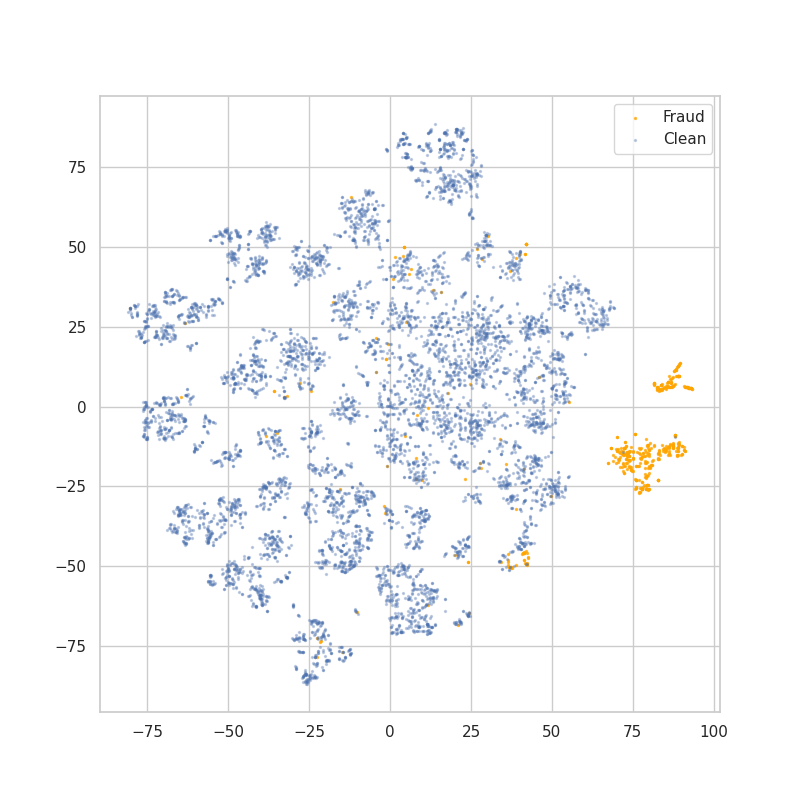

In [ ]:
tsne_scatter(features, labels, dimensions=2, save_as='tsne_initial_2d.png')

Some clusters are clearly distinguishable, indicating that the majority of the data points group together as expected. However, a small portion of the fraudulent transactions remains elusive, blending in with the non-fraudulent data. This subtlety suggests that while the t-SNE visualization has effectively highlighted some separations, there are still challenges in fully isolating all fraudulent activities, underscoring the complexity of detecting fraud in real-world scenarios.

# 4. Data Segmentation for Model Training and Testing

In our methodology, the auto-encoder is trained exclusively on normal (non-fraudulent) transactions. The remaining transactions, which include both normal and fraudulent ones, are reserved to create our test dataset.

The process can be visualized as follows:

![graph2.png](https://miro.medium.com/v2/resize:fit:1620/1*ADt3W-mVBD-2wdQ-svvoxQ.jpeg)

1. **Training: Only Non-Fraudulent Transactions**
   - The dataset is divided into two subsets:
     1. **Training Set**: This subset is used to train the autoencoder.
     2. **Validation Set**: This subset is used to assess the model's ability to generalize beyond the training data.
   
2. **Testing: A Mix of Fraudulent and Non-Fraudulent Transactions**
   - The test set, comprising both types of transactions, is treated as new data for the model to detect anomalies.
     1. **Compute Reconstruction Loss**: Evaluate how accurately the model reconstructs each transaction.
     2. **Apply Threshold**: Transactions with reconstruction losses exceeding a certain threshold are flagged as potential fraud.

This segmentation approach ensures that the auto-encoder learns only the patterns of normal transactions during training, enhancing its ability to identify outliers during the testing phase.

In [ ]:
print(f"""Shape of the datasets:
    clean (rows, cols) = {clean.shape}
    fraud (rows, cols) = {fraud.shape}""")

Shape of the datasets:
    clean (rows, cols) = (284315, 30)
    fraud (rows, cols) = (492, 30)


In [ ]:
# Shuffle the clean dataset to ensure randomness
clean = clean.sample(frac=1).reset_index(drop=True)

# Create the training set using only non-fraudulent transactions
X_train = clean.iloc[:TRAINING_SAMPLE].drop('label', axis=1)

# Create the testing set by combining the remaining non-fraudulent transactions with all fraudulent transactions, then shuffle
X_test = pd.concat([clean.iloc[TRAINING_SAMPLE:], fraud]).sample(frac=1).reset_index(drop=True)

In [ ]:
print(f"""Our testing set is composed as follows:

{X_test.label.value_counts()}""")

Our testing set is composed as follows:

label
0    84315
1      492
Name: count, dtype: int64


In [ ]:
from sklearn.model_selection import train_test_split

# Split the training set into training and validation sets; no labels are needed since all samples are clean
X_train, X_validate = train_test_split(X_train,
                                       test_size=VALIDATE_SIZE,
                                       random_state=RANDOM_SEED)

# Manually separate features and labels from the test set
X_test, y_test = X_test.drop('label', axis=1).values, X_test.label.values

## 4.1. Overview

Here’s an overview of the shapes of the datasets used for training, validation, and testing in our model:

In [ ]:
print(f"""Shape of the datasets:
    training (rows, cols) = {X_train.shape}
    validate (rows, cols) = {X_validate.shape}
    holdout  (rows, cols) = {X_test.shape}""")

Shape of the datasets:
    training (rows, cols) = (160000, 29)
    validate (rows, cols) = (40000, 29)
    holdout  (rows, cols) = (84807, 29)


# 5. Importance of Data Normalization & Standardization

## 5.1. The Role of Normalization

Normalization plays a crucial role in improving the efficiency of the training process, especially when using algorithms like stochastic gradient descent. When data is normalized, it ensures that features are on a similar scale, which can lead to faster and more stable convergence during training. Essentially, normalization makes the optimization process smoother, enabling the model to learn more effectively and produce better results.

![image.png](https://velog.velcdn.com/images/danbibibi/post/7bb44fa1-2fab-44ab-b8e0-20df92da0fb8/image.png)

## 5.2. Timing

When should normalization or standardization be applied during the data processing pipeline?

The general rule is that **normalization should be performed after splitting the data into training and testing sets**. This ensures that the testing data accurately represents real-world scenarios and prevents any leakage of information from the test set into the training process.

To clarify:
- **Training Data**: Normalize the data using the mean and variance calculated from the training set alone.
- **Testing Data**: Apply the same normalization process, but use the mean and variance derived from the training data to maintain consistency.

This method allows for an accurate evaluation of the model's ability to generalize to new, unseen data, which is vital for developing robust and reliable machine learning models.

## 5.3. Constructing Our Data Preprocessing Pipeline

In this section, we will build a data preprocessing pipeline using `sklearn` that standardizes and normalizes our data consistently before model training. This pipeline ensures that all data transformations are applied systematically across both training and validation datasets.

In [ ]:
from sklearn.preprocessing import Normalizer, MinMaxScaler
from sklearn.pipeline import Pipeline

# configure our pipeline
pipeline = Pipeline([('normalizer', Normalizer()),
                     ('scaler', MinMaxScaler())])

## 5.4. Fitting the Pipeline to Training Data
Next, we fit the pipeline to the training data, allowing it to compute and store the necessary parameters

In [ ]:
# get normalization parameters by fitting to the training data
pipeline.fit(X_train);

## 5.5 Implementing Transformations Using Fitted Parameters

Once we have fitted the preprocessing pipeline to our training data, it's essential to apply these transformations uniformly across both the training and validation datasets. This step ensures that all data is scaled and normalized consistently, preserving the integrity of our model's evaluation. Consistency in data processing is key to building a robust machine learning model.

In [ ]:
# transform the training and validation data with these parameters
X_train_transformed = pipeline.transform(X_train)
X_validate_transformed = pipeline.transform(X_validate)

## 5.6. Visualizing Data Before and After Transformation

To understand the impact of our preprocessing steps, let's visualize the data distribution before and after applying the pipeline. Here’s how the data appears before transformation:

<IPython.core.display.Javascript object>

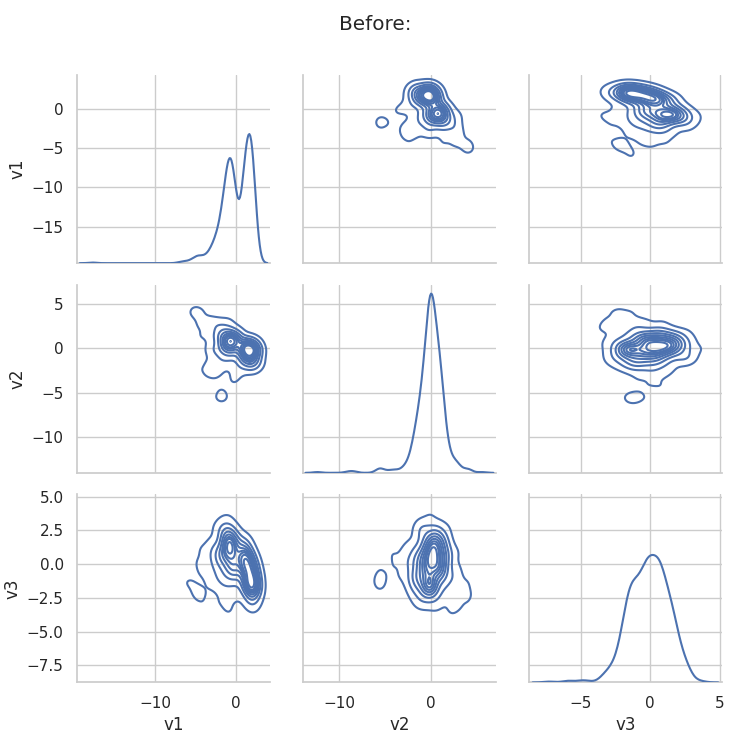

In [ ]:
g = sns.PairGrid(X_train.iloc[:,:3].sample(600, random_state=RANDOM_SEED))
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Before:')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot);
save_as='graph2.png'
plt.savefig(save_as)
plt.show()
from IPython.display import Image
Image(save_as)

<IPython.core.display.Javascript object>

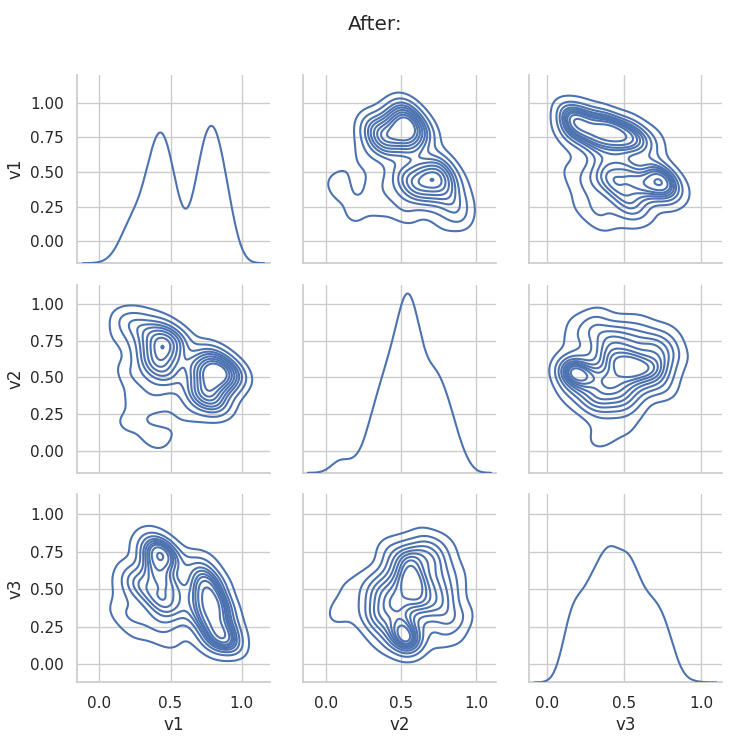

In [ ]:
g = sns.PairGrid(pd.DataFrame(X_train_transformed, columns=column_names).iloc[:,:3].sample(600, random_state=RANDOM_SEED))
plt.subplots_adjust(top=0.9)
g.fig.suptitle('After:')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot)

save_as='graph3.png'
plt.savefig(save_as)
plt.show()
from IPython.display import Image
Image(save_as)

The data appears to be more **uniform and proportionally distributed** after the transformations. Additionally, the ranges have been compressed to fit **between 0 and 1**, ensuring that all features are on a comparable scale. This uniform scaling is crucial for many machine learning algorithms, as it helps improve model performance and convergence.

# 6. Training the Auto-Encoder

## 6.1. Utilizing TensorBoard

TensorBoard is an essential tool for monitoring and visualizing the training process of your model in real-time. It provides insights into key metrics such as loss and accuracy, enabling you to track the progress of your auto-encoder as it learns. Since TensorBoard requires an active kernel to display its visual outputs, it's important to run it in an environment where you can interact with these visualizations, ensuring that you can effectively monitor and adjust the training process as needed.

In [ ]:
# Load the extension and start TensorBoard
#%load_ext tensorboard.notebook
#%tensorboard --logdir logs

# Load the TensorBoard extension
%load_ext tensorboard

# Start TensorBoard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## 6.2. Architecture of Our Model

Keras is widely recognized as the standard high-level API within TensorFlow, praised for its simplicity and power. It's particularly well-suited for building complex neural networks like auto-encoders, which are used for tasks such as dimensionality reduction and anomaly detection. In this section, we’ll define the architecture of our auto-encoder model, leveraging Keras to construct and train it efficiently.

In [ ]:
# data dimensions // hyperparameters
input_dim = X_train_transformed.shape[1]
BATCH_SIZE = 256
EPOCHS = 100

# https://keras.io/layers/core/
autoencoder = tf.keras.models.Sequential([

    # deconstruct / encode
    tf.keras.layers.Dense(input_dim, activation='elu', input_shape=(input_dim, )),
    tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(8, activation='elu'),
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(2, activation='elu'),

    # reconstruction / decode
    tf.keras.layers.Dense(4, activation='elu'),
    tf.keras.layers.Dense(8, activation='elu'),
    tf.keras.layers.Dense(16, activation='elu'),
    tf.keras.layers.Dense(input_dim, activation='elu')

])

# https://keras.io/api/models/model_training_apis/
autoencoder.compile(optimizer="adam",
                    loss="mse",
                    metrics=["acc"])

# print an overview of our model
autoencoder.summary();

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 29)                  │             870 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 16)                  │             480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │              36 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 2)                   │              10 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │              12 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 8)                   │              40 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 16)                  │             144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 29)                  │             493 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,221 (8.68 KB)

 Trainable params: 2,221 (8.68 KB)

 Non-trainable params: 0 (0.00 B)

## 6.3. Callbacks

* Ensure the training continues as long as the model is effectively reducing the training loss.
* Save the model weights only when the validation loss reaches its lowest point, preserving the best-performing version.
* Utilize TensorBoard to gain graphical insights into the model's performance metrics throughout the training process.

In [ ]:
from datetime import datetime

# current date and time
yyyymmddHHMM = datetime.now().strftime('%Y%m%d%H%M')

# new folder for a new run
log_subdir = f'{yyyymmddHHMM}_batch{BATCH_SIZE}_layers{len(autoencoder.layers)}'

# define our early stopping
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.0001,
    patience=10,
    verbose=1,
    mode='min',
    restore_best_weights=True
)

save_model = tf.keras.callbacks.ModelCheckpoint(
    #filepath='autoencoder_best_weights.hdf5',
    filepath='autoencoder_best_weights.keras',

    save_best_only=True,
    monitor='val_loss',
    verbose=0,
    mode='min'
)

tensorboard = tf.keras.callbacks.TensorBoard(
    f'logs/{log_subdir}',
    #batch_size=BATCH_SIZE,
    update_freq='batch'
)

# callbacks argument only takes a list
cb = [early_stop, save_model, tensorboard]

## 6.4. Model Training

During the training phase, the auto-encoder will iteratively adjust its weights to minimize the reconstruction error, aiming to accurately reproduce the input data. We will monitor both the training and validation losses to ensure the model is learning effectively and to avoid overfitting. Throughout this process, the model's performance will be tracked and visualized, enabling us to make informed adjustments as needed to optimize the results.

In [ ]:
history = autoencoder.fit(
    X_train_transformed, X_train_transformed,
    shuffle=True,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=cb,
    validation_data=(X_validate_transformed, X_validate_transformed)
);

Epoch 1/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - acc: 0.1690 - loss: 0.0677 - val_acc: 0.2609 - val_loss: 0.0171
Epoch 2/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - acc: 0.2575 - loss: 0.0168 - val_acc: 0.2796 - val_loss: 0.0152
Epoch 3/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - acc: 0.3149 - loss: 0.0148 - val_acc: 0.3427 - val_loss: 0.0145
Epoch 4/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - acc: 0.3408 - loss: 0.0144 - val_acc: 0.3384 - val_loss: 0.0142
Epoch 5/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - acc: 0.3386 - loss: 0.0141 - val_acc: 0.3245 - val_loss: 0.0139
Epoch 6/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - acc: 0.3276 - loss: 0.0138 - val_acc: 0.3282 - val_loss: 0.0137
Epoch 7/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - acc: 0.3338 - loss: 0.0137 - val_acc: 0.3411 - val_loss: 0.0137
Epoch 8/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - acc: 0.3480 - loss: 0.0136 - val_acc: 0.3558 - val_loss: 0.0135
Epoch 9/100
625/625 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/

# 7. Data Reconstructions

First, we **apply the transformation pipeline to preprocess our test set**.
After preprocessing, the **test data is fed through the trained auto-encoder**, allowing us to evaluate how well the model reconstructs the input data.


In [ ]:
# transform the test set with the pipeline fitted to the training set
X_test_transformed = pipeline.transform(X_test)

# pass the transformed test set through the autoencoder to get the reconstructed result
reconstructions = autoencoder.predict(X_test_transformed)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but Normalizer was fitted with feature names
  warnings.warn(


2651/2651 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


**Calculate the reconstruction loss** for every transaction in the test set. This involves determining the difference between the original input data and the data reconstructed by the auto-encoder. By computing this loss, we can quantify how well the model has learned to replicate the original transactions. A detailed analysis of these reconstruction losses will help us identify anomalies, as transactions with higher losses may indicate instances that the model struggles to reconstruct, potentially flagging them as unusual or fraudulent. Finally, we will **draw a sample** from these losses to further explore and visualize the results.


In [ ]:
# calculating the mean squared error reconstruction loss per row in the numpy array
mse = np.mean(np.power(X_test_transformed - reconstructions, 2), axis=1)

<IPython.core.display.Javascript object>

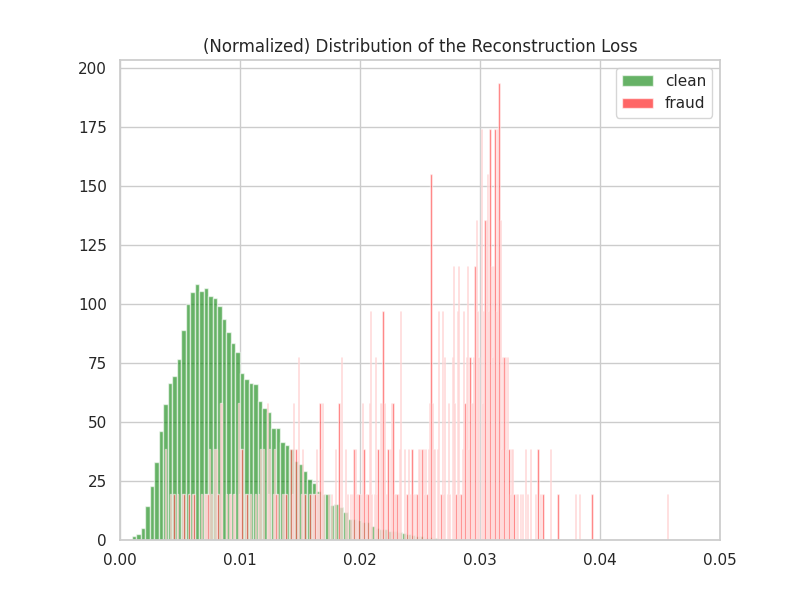

In [ ]:
clean = mse[y_test==0]
fraud = mse[y_test==1]

fig, ax = plt.subplots(figsize=(8,6))  # Increase the size of the plot

# Plot histograms
ax.hist(clean, bins=100, density=True, label="clean", alpha=.6, color="green")  # Green bars (clean transactions)
ax.hist(fraud, bins=400, density=True, label="fraud", alpha=.6, color="red")  # Increase the number of red bars (fraudulent transactions)

# Set axis limits for better visibility
ax.set_xlim(0, 0.05)  # Set the X-axis range from 0 to 0.05
ax.set_ylim(bottom=0)  # Set the lower limit of the Y-axis to 0

# Add title and legend
plt.title("(Normalized) Distribution of the Reconstruction Loss")
plt.legend()

# Use tight_layout for optimal placement of plot elements
plt.tight_layout()

# Adjust margins
plt.subplots_adjust(left=0.15, right=0.9, top=0.9, bottom=0.1)

# Save the plot
save_as='graph4.png'
plt.savefig(save_as)

# Display the plot
plt.show()

# Display the saved image
from IPython.display import Image
Image(save_as)

The results appear promising. Although some transactions manage to evade detection by the autoencoder, the data shows that fraudulent transactions possess distinctive features that differentiate them from the clean ones. This clear separation suggests that the autoencoder has successfully learned to identify and emphasize these anomalies within the dataset.

# 7. Setting a Threshold for Classification

## 7.1. Unsupervised Approach
In an unsupervised setting, the process typically concludes by establishing a threshold that strikes a balance between minimizing false positives and capturing the most anomalous data points.

### 7.1.1. Percentiles
One method to set this threshold is by selecting the top x% of the dataset, labeling these as anomalous. This approach is straightforward and allows for easy adjustment of the sensitivity.

### 7.1.2. MAD (Median Absolute Deviation)
Another approach involves using a **modified Z-score based on the Median Absolute Deviation (MAD)** to identify outliers in the reconstruction data. This method is often considered more robust and scalable compared to using percentiles, particularly in datasets with varying distributions.

In [ ]:
THRESHOLD = 3

def mad_score(points):
    """https://www.itl.nist.gov/div898/handbook/eda/section3/eda35h.htm """
    m = np.median(points)
    ad = np.abs(points - m)
    mad = np.median(ad)

    return 0.6745 * ad / mad

z_scores = mad_score(mse)
outliers = z_scores > THRESHOLD

In [ ]:
print(f"Detected {np.sum(outliers):,} outliers in a total of {np.size(z_scores):,} transactions [{np.sum(outliers)/np.size(z_scores):.2%}].")

Detected 1,871 outliers in a total of 84,807 transactions [2.21%].


## 7.2 Supervised Approach

In this scenario, since we have access to the labels, we can directly verify the effectiveness of our approach by comparing predicted anomalies with actual labels.

### 7.2.1. Evaluating with a Classification Matrix on MAD Outliers

We can take a closer look at the performance of our method by constructing a classification matrix based on the outliers identified using the MAD (Median Absolute Deviation) method. This matrix will help us assess how well the model differentiates between normal and anomalous transactions, providing insights into its accuracy and effectiveness.

In [ ]:
from sklearn.metrics import (confusion_matrix,
                             precision_recall_curve)

# get (mis)classification
cm = confusion_matrix(y_test, outliers)

# true/false positives/negatives
(tn, fp,
 fn, tp) = cm.flatten()

In [ ]:
print(f"""The classifications using the MAD method with threshold={THRESHOLD} are as follows:
{cm}

% of transactions labeled as fraud that were correct (precision): {tp}/({fp}+{tp}) = {tp/(fp+tp):.2%}
% of fraudulent transactions were caught succesfully (recall):    {tp}/({fn}+{tp}) = {tp/(fn+tp):.2%}""")

The classifications using the MAD method with threshold=3 are as follows:
[[82798  1517]
 [  138   354]]

% of transactions labeled as fraud that were correct (precision): 354/(1517+354) = 18.92%
% of fraudulent transactions were caught succesfully (recall):    354/(138+354) = 71.95%


### 7.2.2. Asymmetric Error Cost

In practical applications, it's important to recognize that **the costs of false positives and false negatives are not equal**. Missing a fraudulent transaction (false negative) can be far more costly than incorrectly flagging a legitimate transaction (false positive). This concept is crucial in real-world fraud detection, where the impact of each type of error must be carefully considered. Developing an approach that takes these asymmetric costs into account allows for a more effective and economically sound model.

### 7.2.3. Recall & Precision

In many cases, you will need to decide which metric—recall or precision—holds more significance for your specific application. This decision is known as the **"recall vs precision" trade-off**. To increase recall (the ability to detect all fraudulent cases), you would **lower the Z-score threshold used in the MAD method**. Conversely, to improve precision (the accuracy of the fraud detection), you would increase the threshold. Balancing these two metrics is key to optimizing the performance of your model in line with your priorities.

<IPython.core.display.Javascript object>

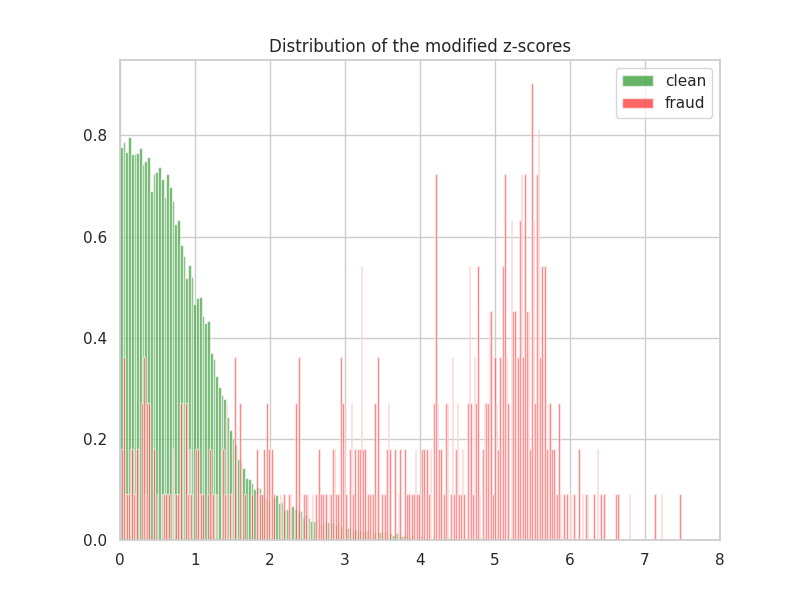

In [ ]:
clean = z_scores[y_test==0]
fraud = z_scores[y_test==1]

fig, ax = plt.subplots(figsize=(8,6))  # Увеличиваем размер графика

# Построение гистограмм
ax.hist(clean, bins=200, density=True, label="clean", alpha=.6, color="green")  # Зеленые колонки
ax.hist(fraud, bins=400, density=True, label="fraud", alpha=.6, color="red")  # Увеличиваем количество красных колонок

ax.set_xlim(0, 8)

# Настройка заголовка и отображение легенды
plt.title("Distribution of the modified z-scores")
plt.legend()

# Используем tight_layout для корректного расположения элементов
plt.tight_layout()

# Настройка отступов
plt.subplots_adjust(left=0.15, right=0.9, top=0.9, bottom=0.1)

# Сохранение графика
save_as='graph5.png'
plt.savefig(save_as)

# Отображение графика
plt.show()

# Отображение сохранённого изображения
from IPython.display import Image
Image(save_as)

<IPython.core.display.Javascript object>

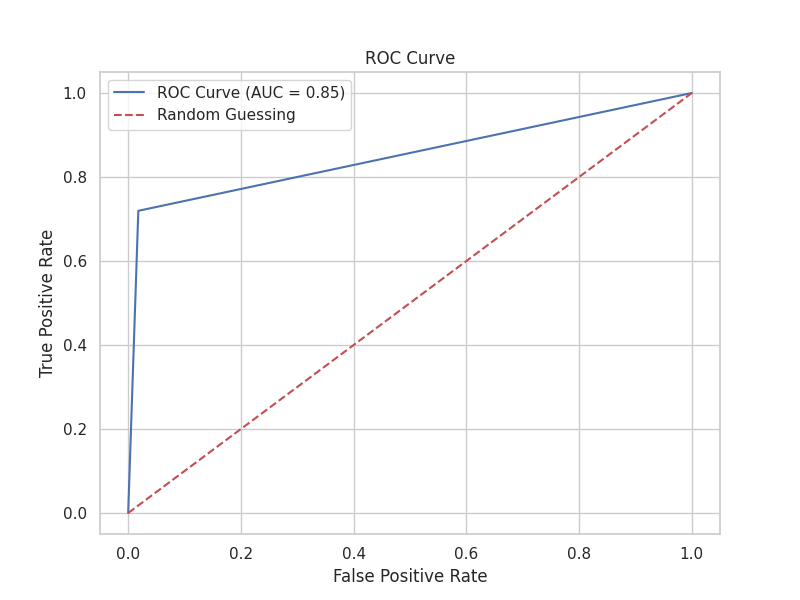

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, outliers)

# Compute AUC score
auc_score = roc_auc_score(y_test, outliers)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='r', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Сохранение графика
save_as='graph6.png'
plt.savefig(save_as)

# Отображение графика
plt.show()

# Отображение сохранённого изображения
from IPython.display import Image
Image(save_as)

<IPython.core.display.Javascript object>

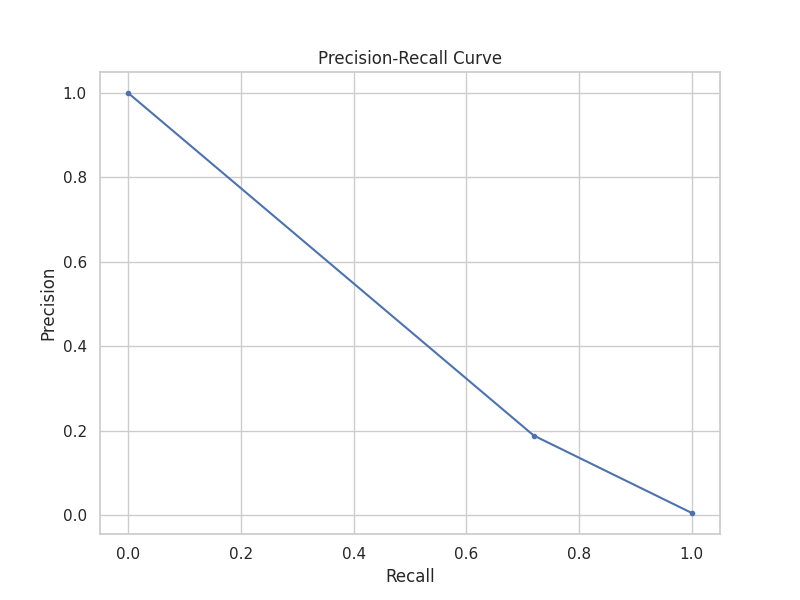

In [ ]:
from sklearn.metrics import precision_recall_curve

# Compute precision-recall pairs for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, outliers)

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# Сохранение графика
save_as='graph7.png'
plt.savefig(save_as)

# Отображение графика
plt.show()

# Отображение сохранённого изображения
from IPython.display import Image
Image(save_as)

<IPython.core.display.Javascript object>

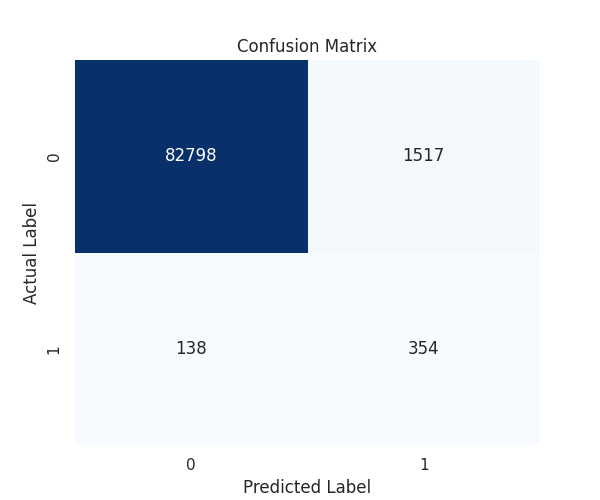

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test, outliers)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

# Сохранение графика
save_as='graph8.png'
plt.savefig(save_as)

# Отображение графика
plt.show()

# Отображение сохранённого изображения
from IPython.display import Image
Image(save_as)

In [ ]:
from sklearn.metrics import f1_score

# Compute F1 score
f1 = f1_score(y_test, outliers)
print(f'F1 Score: {f1:.2f}')

F1 Score: 0.30


In [ ]:
from sklearn.metrics import classification_report

# Print classification report
report = classification_report(y_test, outliers, target_names=['Non-Fraud', 'Fraud'])
print(report)

              precision    recall  f1-score   support

   Non-Fraud       1.00      0.98      0.99     84315
       Fraud       0.19      0.72      0.30       492

    accuracy                           0.98     84807
   macro avg       0.59      0.85      0.64     84807
weighted avg       0.99      0.98      0.99     84807



<IPython.core.display.Javascript object>

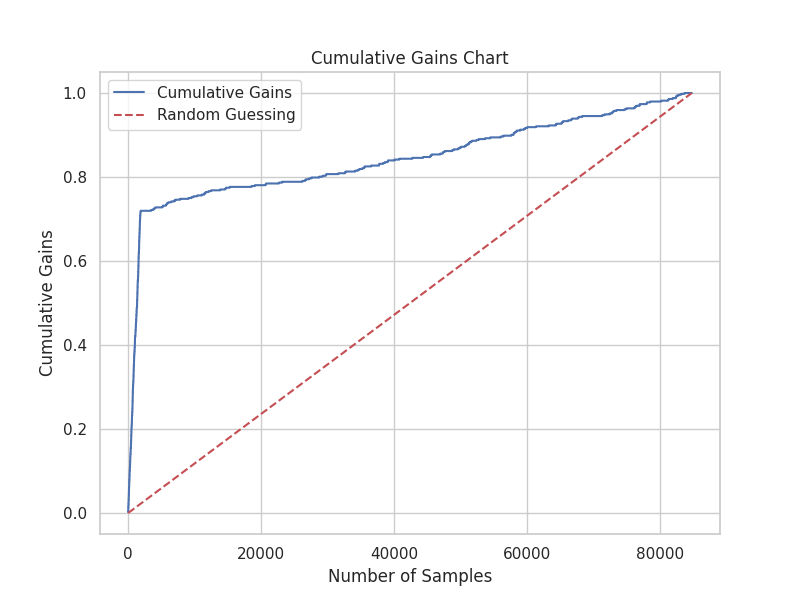

In [ ]:
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt

def plot_cumulative_gain(y_true, y_prob):
    # Sort probabilities and true values based on probability scores
    sorted_indices = np.argsort(y_prob)[::-1]
    sorted_true = np.array(y_true)[sorted_indices]

    # Calculate cumulative sum of true positives
    cumulative_true = np.cumsum(sorted_true)

    # Calculate cumulative gains
    gains = cumulative_true / cumulative_true[-1]

    # Plot cumulative gains chart
    plt.figure(figsize=(8, 6))
    plt.plot(np.arange(len(gains)), gains, label='Cumulative Gains')
    plt.plot([0, len(gains)], [0, 1], linestyle='--', color='r', label='Random Guessing')
    plt.xlabel('Number of Samples')
    plt.ylabel('Cumulative Gains')
    plt.title('Cumulative Gains Chart')
    plt.legend()
    plt.show()
    # Сохранение графика
    save_as='graph9.png'
    plt.savefig(save_as)

    # Отображение графика
    plt.show()

    # Отображение сохранённого изображения
    from IPython.display import Image
    return Image(save_as)


# Example usage
plot_cumulative_gain(y_test, outliers)

# 8. Exploring the Latent Space

Examining the **compressed representation** created by our neural network can provide valuable insights into how the model understands and organizes the data.

## 8.1. Constructing the Encoder

To investigate this latent space, we'll build an encoder that maps the input data to the bottleneck layer of our autoencoder. This encoder is derived from the layers of our existing autoencoder model, allowing us to explore the reduced-dimensional representation that the network has learned.

In [ ]:
encoder = tf.keras.models.Sequential(autoencoder.layers[:5])
encoder.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 29)                  │             870 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 16)                  │             480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │              36 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 2)                   │              10 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,532 (5.98 KB)

 Trainable params: 1,532 (5.98 KB)

 Non-trainable params: 0 (0.00 B)

## 8.2. Undersampling the Data

In line with our earlier t-SNE visualization, we'll undersample the clean transactions to balance the dataset. This approach ensures that our exploration of the latent space is focused and that the visualizations remain clear and meaningful by preventing the clean transactions from overwhelming the fraudulent ones.

In [ ]:
# taking all the fraud, undersampling clean
fraud = X_test_transformed[y_test==1]
clean = X_test_transformed[y_test==0][:len(fraud) * RATIO_TO_FRAUD, ]

# combining arrays & building labels
features = np.append(fraud, clean, axis=0)
labels = np.append(np.ones(len(fraud)),
                   np.zeros(len(clean)))

# getting latent space representation
latent_representation = encoder.predict(features)

print(f'Clean transactions downsampled from {len(X_test_transformed[y_test==0]):,} to {len(clean):,}.')
print('Shape of latent representation:', latent_representation.shape)

246/246 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Clean transactions downsampled from 84,315 to 7,380.
Shape of latent representation: (7872, 2)


## 8.3. Visualizing the Latent Space

Now that we've prepared our data, it's time to visualize the latent space. This step will help us understand how the autoencoder has compressed the input data into lower-dimensional representations. By plotting these compressed representations, we can observe how the network clusters similar data points together, potentially revealing patterns or anomalies within the dataset. This visualization is a crucial step in interpreting the model's internal workings and evaluating its effectiveness.

<IPython.core.display.Javascript object>

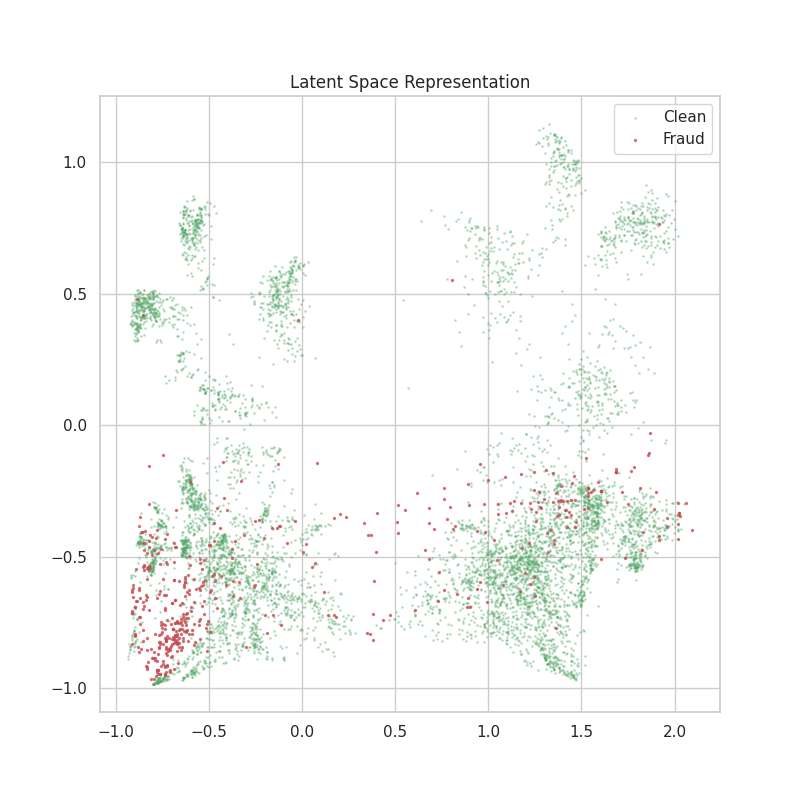

In [ ]:
X = latent_representation[:,0]
y = latent_representation[:,1]

# plotting
plt.subplots(figsize=(8, 8))
plt.scatter(X[labels==0], y[labels==0], s=1, c='g', alpha=0.3, label='Clean')
plt.scatter(X[labels==1], y[labels==1], s=2, c='r', alpha=0.7, label='Fraud')

# labeling
plt.legend(loc='best')
plt.title('Latent Space Representation')

# saving & displaying
save_as='graph6.png'
plt.savefig(save_as)

#plt.savefig('latent_representation_2d');
plt.show()

# Отображение сохранённого изображения
from IPython.display import Image
Image(save_as)

While the clustering is not perfectly distinct, **the majority of fraudulent transactions seem to be grouped together** in the latent space. This observation aligns with the expectation that **the two classes—fraudulent and non-fraudulent—would occupy separate regions** within the latent space. This separation occurs because the **encoder's weights are primarily tuned for normal transactions**, and as a result, it struggles to accurately represent fraudulent ones in the same space.

# 9. Conclusion for the Autoencoder Model

The observed misclassifications suggest that the autoencoder model struggled to generalize perfectly. However, it's crucial to note that **the model was trained exclusively on non-fraudulent data, without ever encountering a single fraudulent transaction**. In this light, its performance is commendable and underscores the potential of **autoencoders as effective tools for anomaly detection**.

To improve the autoencoder's effectiveness further, we could explore the following strategies:
* Refining and enhancing the model architecture to better capture complex patterns.
* Expanding and diversifying the training data by incorporating a wider range of normal transactions.
* Augmenting the dataset with additional features—it's possible that the current data lacks sufficient detail to fully differentiate between normal and fraudulent transactions. In such cases, even well-designed models may struggle, particularly if fraudsters are adept at blending their activities within the available data points.

# 10. Introduction to Additional Algorithms</center>

Following the exploration of the autoencoder model, we now turn our attention to five additional machine learning algorithms to enhance our anomaly detection efforts. These algorithms provide a range of supervised learning approaches that complement the unsupervised nature of the autoencoder, offering a broader perspective on detecting fraudulent transactions.

## 10.1. Dataset Attributes

- **V1 - V28** : Numerical features that are a result of PCA transformation.
- **Time** : Seconds elapsed between each transaction and the first transaction.
- **Amount** : Transaction amount.
- **Class** : Fraud or otherwise (1 or 0).

## 10.2. Algorithms Explored:

### 10.2.1. Logistic Regression
Logistic Regression is a simple yet powerful model for binary classification tasks. Its strength lies in its interpretability, as it provides clear insights into the influence of each feature on the prediction. Moreover, Logistic Regression is computationally efficient, making it well-suited for large datasets.

However, Logistic Regression assumes a linear relationship between the input features and the output, which can limit its effectiveness in capturing complex patterns. Additionally, it may struggle with highly imbalanced datasets, as it tends to predict the majority class more often. This limitation requires careful preprocessing, such as balancing the dataset or adjusting class weights.

### 10.2.2. Support Vector Classifier (SVC)
Support Vector Classifier (SVC) is a robust classification algorithm that works well with both linear and non-linear data by using kernel tricks to transform the input space. One of its key strengths is its ability to find the optimal boundary between classes, which can be particularly useful in distinguishing between fraudulent and non-fraudulent transactions.

However, SVC can be computationally intensive, especially with large datasets, making it less scalable than some other algorithms. Additionally, it can be sensitive to the choice of hyperparameters, particularly the regularization parameter and kernel type, which requires careful tuning to achieve optimal performance.

### 10.2.3. Decision Tree Classifier
Decision Tree Classifier is known for its simplicity and interpretability, making it a popular choice for many classification tasks. It visualizes the decision-making process, allowing for easy interpretation of how decisions are made based on feature values. Decision Trees are also flexible and can handle both numerical and categorical data effectively.

On the downside, Decision Trees are prone to overfitting, especially when they become too complex, capturing noise in the data rather than the underlying pattern. They can also be unstable, as small changes in the data can lead to different tree structures, affecting the consistency of the results. Regularization techniques like pruning are often necessary to mitigate these issues.

### 10.2.4. Random Forest Classifier
Random Forest Classifier is an ensemble learning method that combines multiple decision trees to improve classification accuracy. One of its primary strengths is its ability to reduce overfitting by averaging the predictions of multiple trees, resulting in a more robust model. It also handles missing values and maintains accuracy when a significant portion of the data is missing.

However, Random Forests can be less interpretable than single decision trees due to the aggregation of multiple trees, making it difficult to understand the decision-making process. Additionally, it can be computationally expensive, especially with a large number of trees, which may increase training time and resource consumption.

### 10.2.5. K-Nearest Neighbors (KNN)
K-Nearest Neighbors (KNN) is a non-parametric algorithm that is straightforward and easy to implement. It makes predictions by considering the closest data points (neighbors) in the feature space, making it highly effective for small datasets where the relationships between data points are clear. KNN is also versatile, as it can be used for both classification and regression tasks.

However, KNN's simplicity can be a drawback for larger datasets, as it requires significant computational power to calculate distances between all data points. Additionally, KNN is sensitive to the choice of distance metric and the number of neighbors, which can significantly impact its performance. This sensitivity requires careful tuning and consideration of the dataset's characteristics.

# 11. Dataset Information

The dataset used in this project is the Credit Card Fraud Detection dataset from Kaggle, which contains transactions made by European cardholders over two days in September 2013. It consists of 284,807 transactions, out of which only 492 are fraudulent, making this a highly imbalanced dataset. The features in the dataset (V1 - V28) are numerical and are the result of a Principal Component Analysis (PCA) transformation, while the 'Time' and 'Amount' features remain in their original form.

Given the differences in the nature of the models being explored beyond the autoencoder, the dataset will be reloaded, and preprocessing steps such as feature selection, data balancing, and normalization will be conducted anew. This is necessary because the data preparation procedures for the additional algorithms differ significantly from those required for an autoencoder, particularly in how the features are treated and how the dataset is balanced for training.

Moreover, since each algorithm has its own strengths and weaknesses, the data will need to be tailored to optimize performance for each model. For example, algorithms like K-Nearest Neighbors may require a more refined approach to feature scaling, while ensemble methods like Random Forests might benefit from different feature selection techniques. By recalibrating the dataset processing for each model, we aim to ensure that each algorithm is provided with the most suitable version of the data for optimal performance.

## 11.1. Import the Necessary Libraries :

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
# Download the Credit Card Fraud Detection dataset from Kaggle
!kaggle datasets download -d mlg-ulb/creditcardfraud

# Unzip the downloaded dataset file
!unzip creditcardfraud.zip

Dataset URL: https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud
License(s): DbCL-1.0
creditcardfraud.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  creditcardfraud.zip
replace creditcard.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: creditcard.csv          


In [ ]:
data = pd.read_csv('/content/creditcard.csv')
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.00,-1.36,-0.07,2.54,1.38,-0.34,0.46,0.24,0.10,0.36,...,-0.02,0.28,-0.11,0.07,0.13,-0.19,0.13,-0.02,149.62,0
1,0.00,1.19,0.27,0.17,0.45,0.06,-0.08,-0.08,0.09,-0.26,...,-0.23,-0.64,0.10,-0.34,0.17,0.13,-0.01,0.01,2.69,0
2,1.00,-1.36,-1.34,1.77,0.38,-0.50,1.80,0.79,0.25,-1.51,...,0.25,0.77,0.91,-0.69,-0.33,-0.14,-0.06,-0.06,378.66,0
3,1.00,-0.97,-0.19,1.79,-0.86,-0.01,1.25,0.24,0.38,-1.39,...,-0.11,0.01,-0.19,-1.18,0.65,-0.22,0.06,0.06,123.50,0
4,2.00,-1.16,0.88,1.55,0.40,-0.41,0.10,0.59,-0.27,0.82,...,-0.01,0.80,-0.14,0.14,-0.21,0.50,0.22,0.22,69.99,0


## 11.2. Data Info :

In [ ]:
data.shape

(284807, 31)

In [ ]:
data.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

<Axes: >

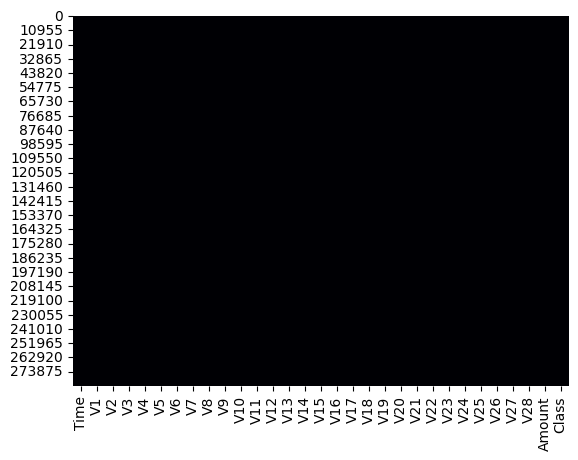

In [ ]:
sns.heatmap(data.isnull(),cmap = 'magma',cbar = False)

- **No null values** present in the data!

In [ ]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,...,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00
mean,94813.86,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,...,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,88.35,0.00
std,47488.15,1.96,1.65,1.52,1.42,1.38,1.33,1.24,1.19,1.10,...,0.73,0.73,0.62,0.61,0.52,0.48,0.40,0.33,250.12,0.04
min,0.00,-56.41,-72.72,-48.33,-5.68,-113.74,-26.16,-43.56,-73.22,-13.43,...,-34.83,-10.93,-44.81,-2.84,-10.30,-2.60,-22.57,-15.43,0.00,0.00
25%,54201.50,-0.92,-0.60,-0.89,-0.85,-0.69,-0.77,-0.55,-0.21,-0.64,...,-0.23,-0.54,-0.16,-0.35,-0.32,-0.33,-0.07,-0.05,5.60,0.00
50%,84692.00,0.02,0.07,0.18,-0.02,-0.05,-0.27,0.04,0.02,-0.05,...,-0.03,0.01,-0.01,0.04,0.02,-0.05,0.00,0.01,22.00,0.00
75%,139320.50,1.32,0.80,1.03,0.74,0.61,0.40,0.57,0.33,0.60,...,0.19,0.53,0.15,0.44,0.35,0.24,0.09,0.08,77.16,0.00
max,172792.00,2.45,22.06,9.38,16.88,34.80,73.30,120.59,20.01,15.59,...,27.20,10.50,22.53,4.58,7.52,3.52,31.61,33.85,25691.16,1.00


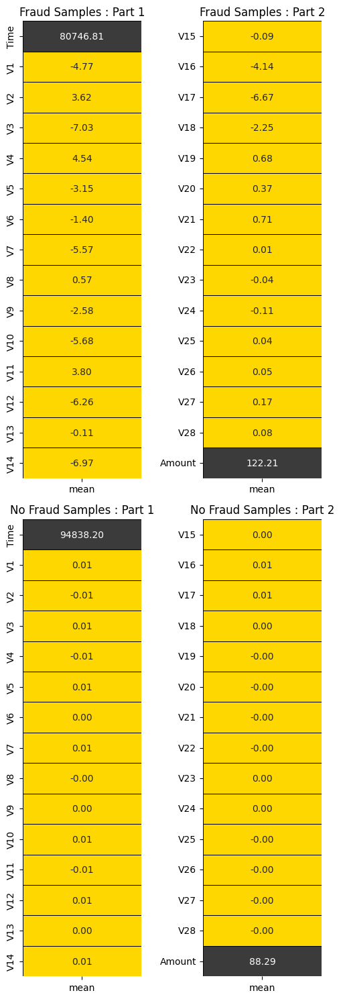

In [ ]:
fraud = data[data['Class'] == 1].describe().T
nofraud = data[data['Class'] == 0].describe().T

colors = ['#FFD700','#3B3B3C']

fig,ax = plt.subplots(nrows = 2,ncols = 2,figsize = (5,15))
plt.subplot(2,2,1)
sns.heatmap(fraud[['mean']][:15],annot = True,cmap = colors,linewidths = 0.5,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('Fraud Samples : Part 1');

plt.subplot(2,2,2)
sns.heatmap(fraud[['mean']][15:30],annot = True,cmap = colors,linewidths = 0.5,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('Fraud Samples : Part 2');

plt.subplot(2,2,3)
sns.heatmap(nofraud[['mean']][:15],annot = True,cmap = colors,linewidths = 0.5,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('No Fraud Samples : Part 1');

plt.subplot(2,2,4)
sns.heatmap(nofraud[['mean']][15:30],annot = True,cmap = colors,linewidths = 0.5,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('No Fraud Samples : Part 2');

fig.tight_layout(w_pad = 2)

- **Mean** values of features for **Fraud** & **No Fraud** cases:
- For **No Fraud** cases, the mean values of **V1 - V28** are nearly **0** across all features. The mean transaction **Amount** for **No Fraud** cases is 88.29, which is lower than the mean amount of 122.21 for **Fraud** cases.
- The **Time** elapsed for **No Fraud** transactions tends to be longer compared to **Fraud** transactions.
- These differences could serve as key indicators for detecting **fraudulent** transactions.

# 12. Data Visualization</div></center>

## 12.1. Target Variable Visualization (Class) :

<ipython-input-15-b5d286b8227b>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='Class', data=data, edgecolor='black', palette=colors)
<ipython-input-15-b5d286b8227b>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['No Fraud', 'Fraud'])


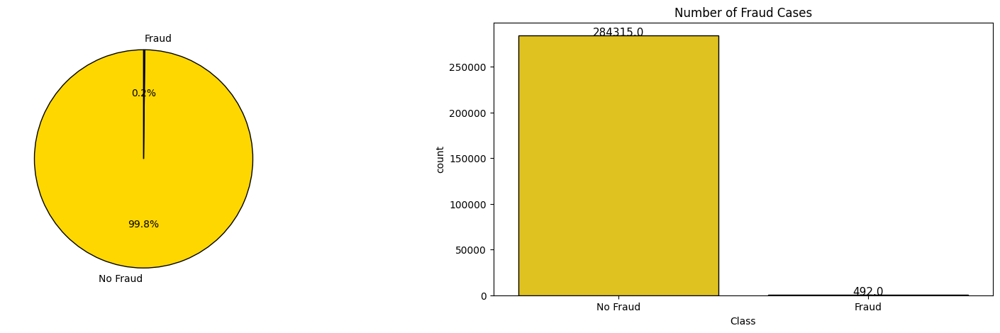

In [ ]:
fraud = len(data[data['Class'] == 1]) / len(data) * 100
nofraud = len(data[data['Class'] == 0]) / len(data) * 100
fraud_percentage = [nofraud,fraud]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))

# Pie chart
plt.subplot(1,2,1)
plt.pie(fraud_percentage, labels=['No Fraud', 'Fraud'], autopct='%1.1f%%', startangle=90, colors=colors,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})

# Countplot
plt.subplot(1,2,2)
ax = sns.countplot(x='Class', data=data, edgecolor='black', palette=colors)
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
            horizontalalignment='center', fontsize=11)
ax.set_xticklabels(['No Fraud', 'Fraud'])
plt.title('Number of Fraud Cases')

plt.show()

- The data is clearly **highly unbalanced** with majority of the transactions being **No Fraud**.
- Due to highly unbalanced data, the classification model will bias its prediction towards the majority class, **No Fraud**.
- Hence, data balancing becomes a crucial part in building a robust model.

# 13. Feature Selection

## 13.1. Correlation Matrix

<Axes: >

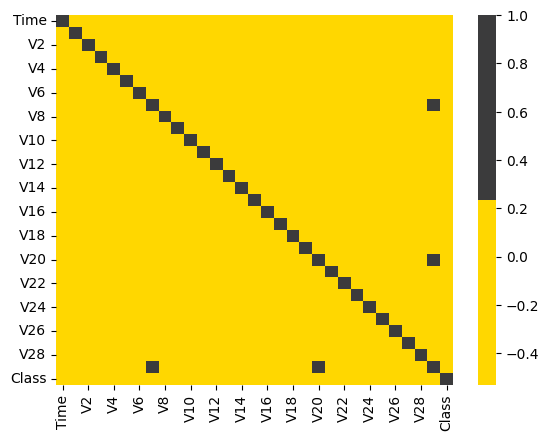

In [ ]:
sns.heatmap(data.corr(),cmap = colors,cbar = True)

- The dataset contains numerous features, making it challenging to derive clear insights directly.
- To address this, we will focus on plotting the correlation map specifically with the target variable.

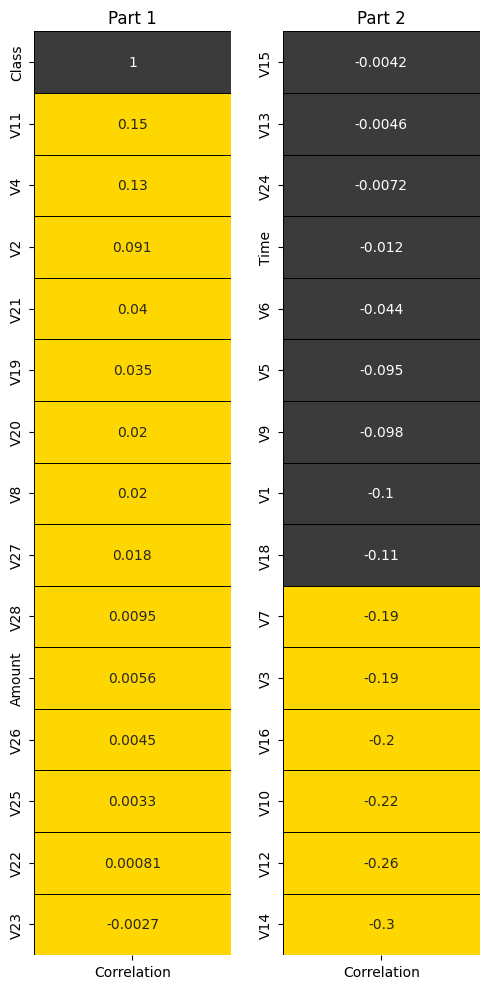

In [ ]:
corr = data.corrwith(data['Class']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlation']
fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (5,10))

plt.subplot(1,2,1)
sns.heatmap(corr.iloc[:15,:],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False)
plt.title('Part 1')

plt.subplot(1,2,2)
sns.heatmap(corr.iloc[15:30],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False)
plt.title('Part 2')

fig.tight_layout(w_pad = 2)

- For feature selection, we will **exclude** the features having correlation values between **[-0.1,0.1]**.
- V4, V11 are positively correlated and V7, V3, V16, V10, V12, V14, V17 are negatively correlated with the **Class** feature.

## 13.2. ANOVA Test

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

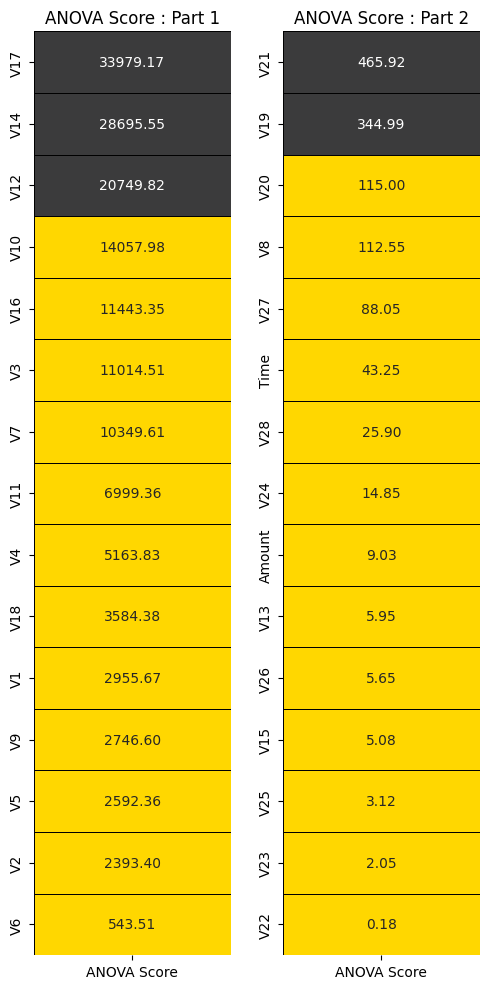

In [ ]:
features = data.loc[:,:'Amount']
target = data.loc[:,'Class']

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score'])
featureScores = featureScores.sort_values(ascending = False,by = 'ANOVA Score')

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (5,10))

plt.subplot(1,2,1)
sns.heatmap(featureScores.iloc[:15,:],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False, fmt = '.2f')
plt.title('ANOVA Score : Part 1')

plt.subplot(1,2,2)
sns.heatmap(featureScores.iloc[15:30],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False, fmt = '.2f')
plt.title('ANOVA Score : Part 2')

fig.tight_layout(w_pad = 2)

- Higher the value of the ANOVA score, higher the importance of that feature with the target variable.
- From the above plot, we will reject features with values less than 50.
- In this case, we will create 2 models based on features selected from the **Correlation Plot** & **ANOVA Score**.

#### Dataset for Model based on Correlation Plot :

In [ ]:
df1 = data[['V3','V4','V7','V10','V11','V12','V14','V16','V17','Class']].copy(deep = True)
df1.head()

,V3,V4,V7,V10,V11,V12,V14,V16,V17,Class
0,2.54,1.38,0.24,0.09,-0.55,-0.62,-0.31,-0.47,0.21,0
1,0.17,0.45,-0.08,-0.17,1.61,1.07,-0.14,0.46,-0.11,0
2,1.77,0.38,0.79,0.21,0.62,0.07,-0.17,-2.89,1.11,0
3,1.79,-0.86,0.24,-0.05,-0.23,0.18,-0.29,-1.06,-0.68,0
4,1.55,0.40,0.59,0.75,-0.82,0.54,-1.12,-0.45,-0.24,0


#### Dataset for Model based on ANOVA Score :

In [ ]:
df2 = data.copy(deep = True)
df2.drop(columns = list(featureScores.index[20:]),inplace = True)
df2.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V12,V14,V16,V17,V18,V19,V20,V21,V27,Class
0,-1.36,-0.07,2.54,1.38,-0.34,0.46,0.24,0.10,0.36,0.09,...,-0.62,-0.31,-0.47,0.21,0.03,0.40,0.25,-0.02,0.13,0
1,1.19,0.27,0.17,0.45,0.06,-0.08,-0.08,0.09,-0.26,-0.17,...,1.07,-0.14,0.46,-0.11,-0.18,-0.15,-0.07,-0.23,-0.01,0
2,-1.36,-1.34,1.77,0.38,-0.50,1.80,0.79,0.25,-1.51,0.21,...,0.07,-0.17,-2.89,1.11,-0.12,-2.26,0.52,0.25,-0.06,0
3,-0.97,-0.19,1.79,-0.86,-0.01,1.25,0.24,0.38,-1.39,-0.05,...,0.18,-0.29,-1.06,-0.68,1.97,-1.23,-0.21,-0.11,0.06,0
4,-1.16,0.88,1.55,0.40,-0.41,0.10,0.59,-0.27,0.82,0.75,...,0.54,-1.12,-0.45,-0.24,-0.04,0.80,0.41,-0.01,0.22,0


# 14. Balancing the Dataset

- When dealing with imbalanced data, two primary strategies can be employed:

    - **Undersampling**: Reduce the number of majority class samples to balance the dataset.
    - **Oversampling**: Increase the number of minority class samples to match the majority class.

- To achieve optimal performance, we will combine both undersampling and oversampling techniques.
- Initially, we will reduce the majority class samples, followed by increasing the minority class samples.
- For implementing data balancing, we will utilize the **imblearn** library.
- **Installation Command**: pip install imbalanced-learn

In [ ]:
import imblearn
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

## 14.2. Data Balancing for Model based on Correlation Plot :

In [ ]:
over = SMOTE(sampling_strategy = 0.5)
under = RandomUnderSampler(sampling_strategy = 0.1)
f1 = df1.iloc[:,:9].values
t1 = df1.iloc[:,9].values

steps = [('under', under),('over', over)]
pipeline = Pipeline(steps=steps)
f1, t1 = pipeline.fit_resample(f1, t1)
Counter(t1)

Counter({0: 4920, 1: 2460})

#### Data Balancing for Model based on ANOVA Score :

In [ ]:
over = SMOTE(sampling_strategy = 0.5)
under = RandomUnderSampler(sampling_strategy = 0.1)
f2 = df2.iloc[:,:20].values
t2 = df2.iloc[:,20].values

steps = [('under', under),('over', over)]
pipeline = Pipeline(steps=steps)
f2, t2 = pipeline.fit_resample(f2, t2)
Counter(t2)

Counter({0: 4920, 1: 2460})

## 14.3. Data Balancing Calculations

- **Sampling Strategy**: This ratio is crucial for both oversampling and undersampling methods.
- **Formula**: **(Samples of Minority Class) / (Samples of Majority Class)**

- In our scenario:

    - **Majority Class (No Fraud Cases)**: 284,315 samples
    - **Minority Class (Fraud Cases)**: 492 samples

### 14.3.1. Undersampling: Reducing the Majority Class

- **Sampling Strategy**: 0.1
- Calculation: 0.1 = (492) / Majority Class Samples
- After undersampling:

    - **Majority Class (No Fraud Cases)**: 4,920 samples
    - **Minority Class (Fraud Cases)**: 492 samples

### 14.3.2. Oversampling: Increasing the Minority Class

- **Sampling Strategy**: 0.5
- Calculation: 0.5 = (Minority Class Samples) / 4,920
- After oversampling:

    - **Majority Class (No Fraud Cases)**: 4,920 samples
    - **Minority Class (Fraud Cases)**: 2,460 samples

### 14.3.3. Final Balanced Class Samples:

    - **Majority Class (No Fraud Cases)**: 4,920 samples
    - **Minority Class (Fraud Cases)**: 2,460 samples

- For imbalanced datasets, duplicating data helps address potential biases in predictions.
- Due to this duplication process, **synthetic data** is utilized to prevent predictions from being skewed towards the majority class.
- As a result, evaluating models solely on **accuracy** can be misleading. Instead, we will focus on **confusion matrix, ROC-AUC graph, and ROC-AUC score** for more accurate model evaluation.

# 15. Modeling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

In [ ]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(f1, t1, test_size = 0.20, random_state = 2)
x_train2, x_test2, y_train2, y_test2 = train_test_split(f2, t2, test_size = 0.20, random_state = 2)

- Splitting the data into **80 - 20 train - test** groups.

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, RocCurveDisplay

def model(classifier, x_train, y_train, x_test, y_test):
    # Train the model
    classifier.fit(x_train, y_train)

    # Make predictions
    prediction = classifier.predict(x_test)

    # Cross-validation score
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    print("Cross Validation Score : ", '{0:.2%}'.format(cross_val_score(classifier, x_train, y_train, cv=cv, scoring='roc_auc').mean()))

    # ROC AUC score
    print("ROC_AUC Score : ", '{0:.2%}'.format(roc_auc_score(y_test, prediction)))

    # Plot ROC curve
    RocCurveDisplay.from_estimator(classifier, x_test, y_test)
    plt.title('ROC_AUC_Plot')
    plt.show()


def model_evaluation(classifier,x_test,y_test):

    # Confusion Matrix
    cm = confusion_matrix(y_test,classifier.predict(x_test))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap = 'Blues',fmt ='')

    # Classification Report
    print(classification_report(y_test,classifier.predict(x_test)))

## 15.1. Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
classifier_lr = LogisticRegression(random_state = 0,C=10,penalty= 'l2')

#### Model based on Correlation Plot :

Cross Validation Score :  98.17%
ROC_AUC Score :  93.15%


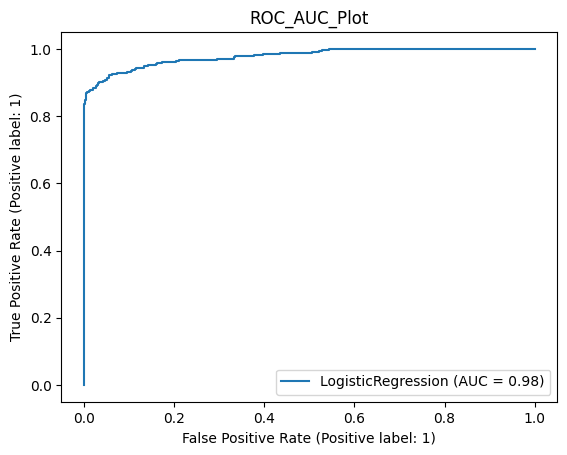

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       975
           1       0.98      0.87      0.92       501

    accuracy                           0.95      1476
   macro avg       0.96      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



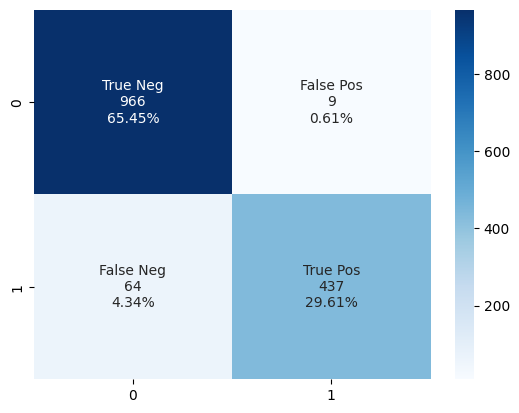

In [ ]:
model(classifier_lr,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_lr,x_test1,y_test1)

#### Model based on ANOVA Score :

Cross Validation Score :  98.68%
ROC_AUC Score :  93.59%


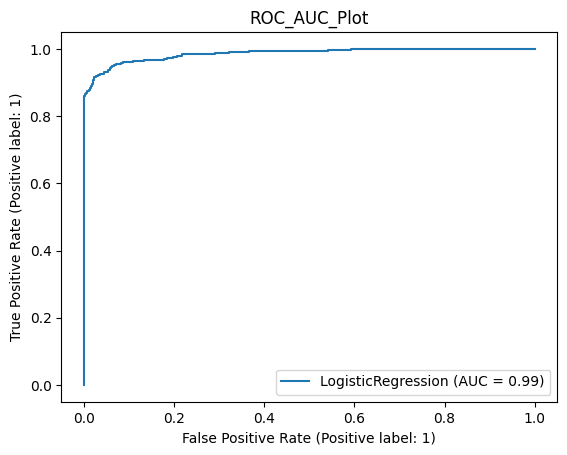

              precision    recall  f1-score   support

           0       0.95      0.98      0.96       975
           1       0.96      0.89      0.92       501

    accuracy                           0.95      1476
   macro avg       0.95      0.94      0.94      1476
weighted avg       0.95      0.95      0.95      1476



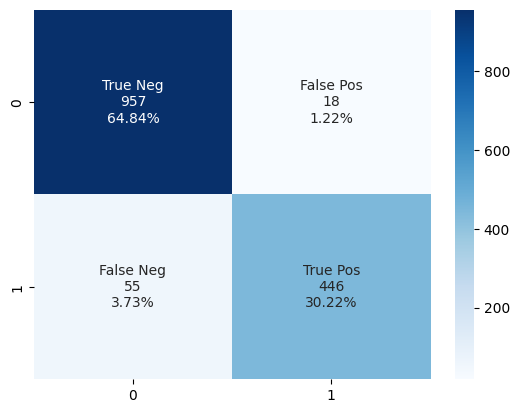

In [ ]:
model(classifier_lr,x_train2,y_train2,x_test2,y_test2)
model_evaluation(classifier_lr,x_test2,y_test2)

## 15.2. Support Vector Classifier :

In [ ]:
from sklearn.svm import SVC

In [ ]:
classifier_svc = SVC(kernel = 'linear',C = 0.1)

#### Model based on Correlation Plot :

Cross Validation Score :  98.14%
ROC_AUC Score :  92.71%


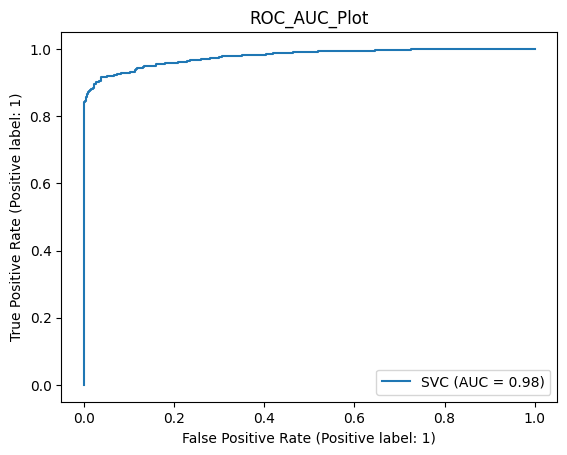

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       975
           1       0.99      0.86      0.92       501

    accuracy                           0.95      1476
   macro avg       0.96      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



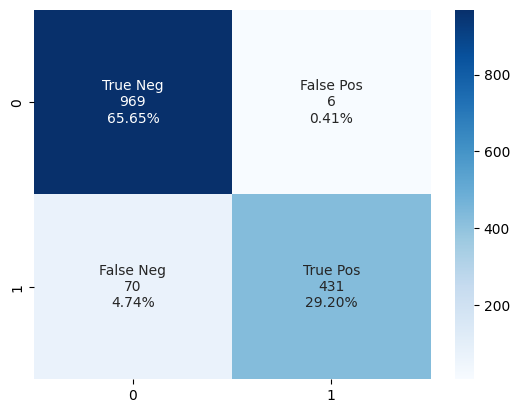

In [ ]:
model(classifier_svc,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_svc,x_test1,y_test1)

#### Model based on ANOVA Score :

Cross Validation Score :  98.70%
ROC_AUC Score :  93.45%


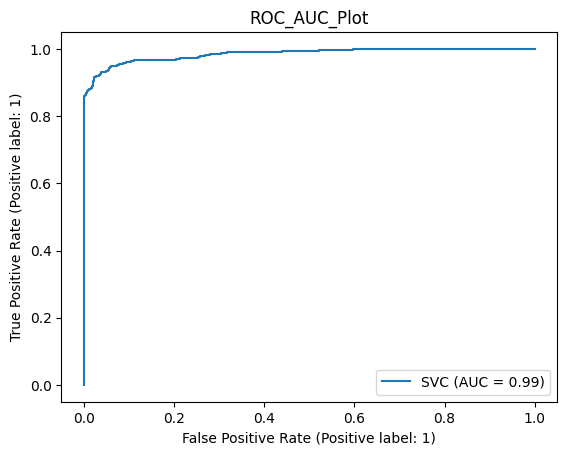

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       975
           1       0.98      0.88      0.93       501

    accuracy                           0.95      1476
   macro avg       0.96      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



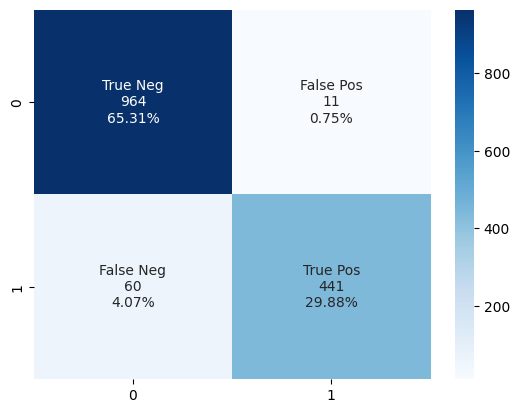

In [ ]:
model(classifier_svc,x_train2,y_train2,x_test2,y_test2)
model_evaluation(classifier_svc,x_test2,y_test2)

## 15.3. Decision Tree Classifier :

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
classifier_dt = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1)

#### Model based on Correlation Plot :

Cross Validation Score :  96.84%
ROC_AUC Score :  92.71%


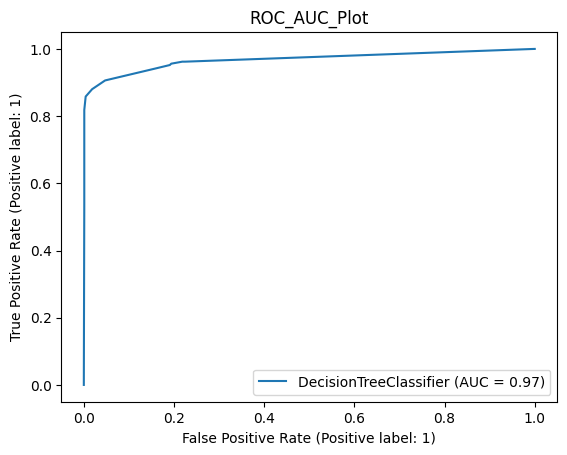

              precision    recall  f1-score   support

           0       0.93      1.00      0.96       975
           1       0.99      0.86      0.92       501

    accuracy                           0.95      1476
   macro avg       0.96      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



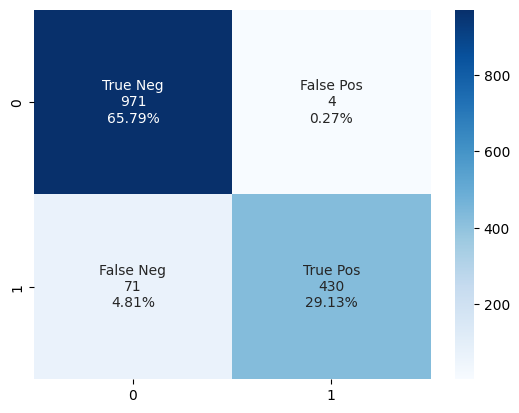

In [ ]:
model(classifier_dt,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_dt,x_test1,y_test1)

#### Model based on ANOVA Score :

Cross Validation Score :  96.99%
ROC_AUC Score :  92.84%


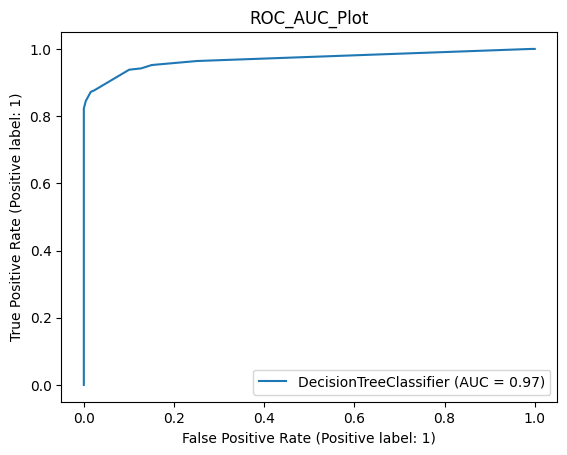

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       975
           1       0.97      0.87      0.92       501

    accuracy                           0.95      1476
   macro avg       0.95      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



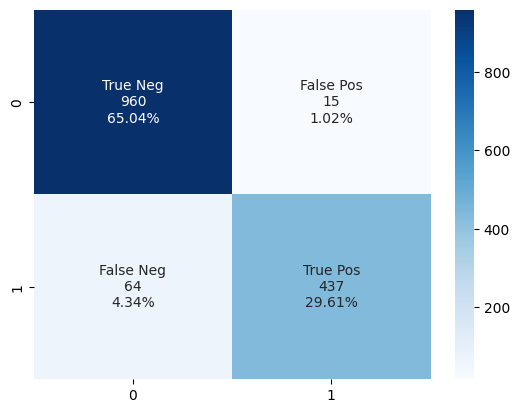

In [ ]:
model(classifier_dt,x_train2,y_train2,x_test2,y_test2)
model_evaluation(classifier_dt,x_test2,y_test2)

## 15.4. Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

#### Model based on Correlation Plot :

Cross Validation Score :  98.07%
ROC_AUC Score :  92.56%


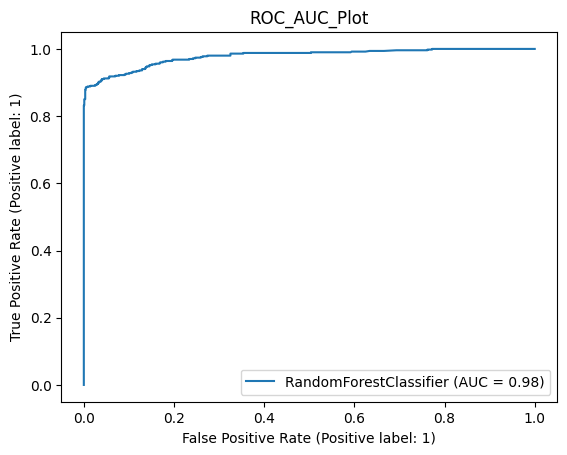

              precision    recall  f1-score   support

           0       0.93      1.00      0.96       975
           1       0.99      0.85      0.92       501

    accuracy                           0.95      1476
   macro avg       0.96      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



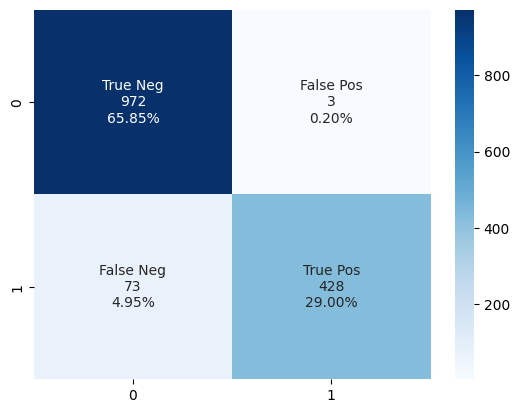

In [ ]:
model(classifier_rf,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_rf,x_test1,y_test1)

#### Model based on ANOVA Score :

Cross Validation Score :  98.29%
ROC_AUC Score :  92.96%


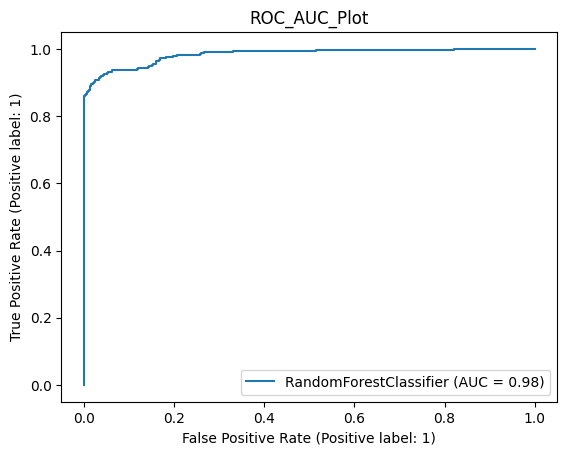

              precision    recall  f1-score   support

           0       0.93      1.00      0.96       975
           1       1.00      0.86      0.92       501

    accuracy                           0.95      1476
   macro avg       0.97      0.93      0.94      1476
weighted avg       0.95      0.95      0.95      1476



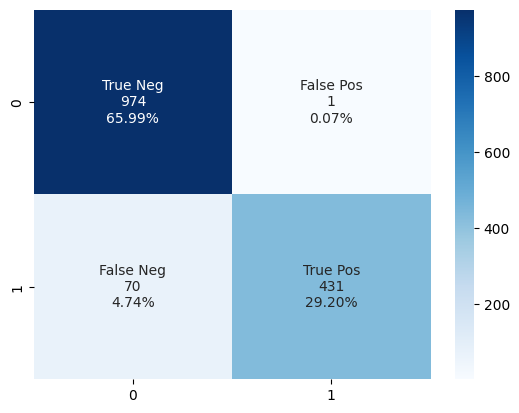

In [ ]:
model(classifier_rf,x_train2,y_train2,x_test2,y_test2)
model_evaluation(classifier_rf,x_test2,y_test2)

## 15.5. K-Nearest Neighbors

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
classifier_knn = KNeighborsClassifier(leaf_size = 1, n_neighbors = 3,p = 1)

#### Model based on Correlation Plot :

Cross Validation Score :  99.18%
ROC_AUC Score :  97.39%


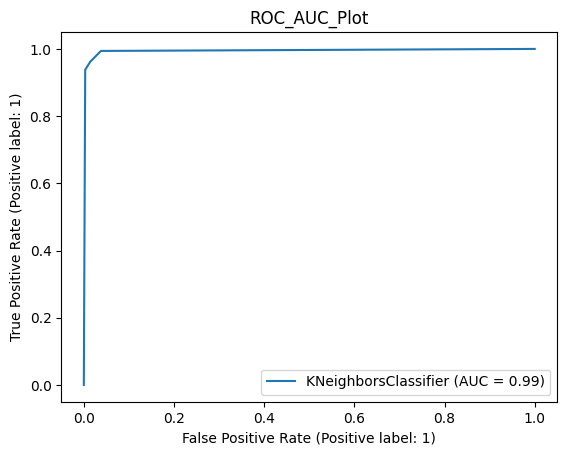

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       975
           1       0.97      0.96      0.97       501

    accuracy                           0.98      1476
   macro avg       0.98      0.97      0.98      1476
weighted avg       0.98      0.98      0.98      1476



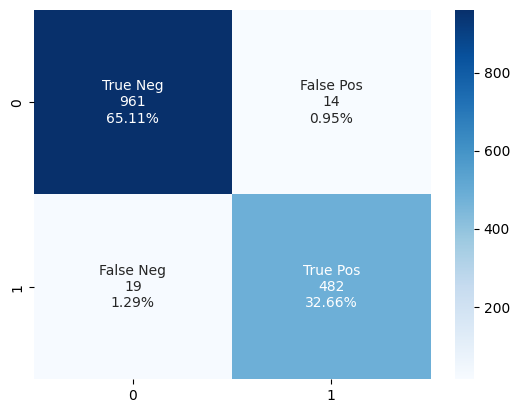

In [ ]:
model(classifier_knn,x_train1,y_train1,x_test1,y_test1)
model_evaluation(classifier_knn,x_test1,y_test1)

#### Model based on ANOVA Score :

Cross Validation Score :  99.59%
ROC_AUC Score :  99.03%


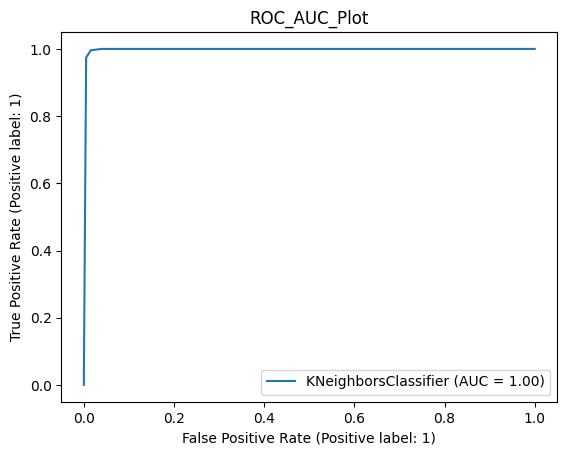

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       975
           1       0.97      1.00      0.98       501

    accuracy                           0.99      1476
   macro avg       0.98      0.99      0.99      1476
weighted avg       0.99      0.99      0.99      1476



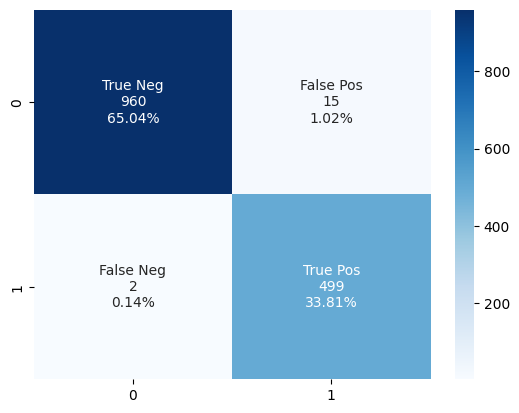

In [ ]:
model(classifier_knn,x_train2,y_train2,x_test2,y_test2)
model_evaluation(classifier_knn,x_test2,y_test2)